## Pitch Analysis

In [1]:
import librosa
import numpy as np
import librosa.display
import matplotlib.pyplot as plt
import IPython.display as ipd
import os
import math
import utils2
import pandas as pd
import pickle
import libfmp.c6, libfmp.b
import warnings
from matplotlib.font_manager import FontProperties
import regex as re
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from matplotlib.lines import Line2D
from scipy.interpolate import make_interp_spline
from scipy.interpolate import Akima1DInterpolator
from itertools import groupby
import parselmouth
import scipy
from scipy.signal import savgol_filter
import copy
import crepe
import sys

from pydub import AudioSegment, silence
from pydub.playback import play
import soundfile as sf
from praatio import tgio
import soundfile as sf

import ipywidgets as widgets
import IPython.display as ipd
from IPython.display import display, clear_output

import expressiveness_measure_new


# Ignore all warnings
warnings.filterwarnings("ignore")



/Users/yashbhake/Desktop/MIR/ipynb notebooks/mirenv1/lib/python3.10/site-packages/music21/ext/joblib/backports.py:9: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import parse_version


In [2]:
syllable = "C2L1B1"

In [3]:
parent_dir = os.path.dirname(os.getcwd())
base_folder = os.path.join(parent_dir, 'All_audio_files_16kHz')

def get_song_artist_mapping(root_folder):
    song_artist_dict = {} 
    for song_folder in os.listdir(root_folder):
        song_path = os.path.join(root_folder, song_folder)
        if os.path.isdir(song_path):
            # Collect artist folders inside each song folder
            artists = [artist for artist in os.listdir(song_path) if os.path.isdir(os.path.join(song_path, artist))]
            song_artist_dict[song_folder] = artists
    
    return song_artist_dict

options = get_song_artist_mapping(base_folder)


folder_dropdown = widgets.Dropdown(options=options.keys(), description="Folder:")
artist_dropdown = widgets.Dropdown(description="Artist:")
fetch_button = widgets.Button(description="Get Files")
output = widgets.Output()

files = []  # Declare files variable outside
folder_artist = []

def update_artist_dropdown(change):
    artist_dropdown.options = options[change['new']]

folder_dropdown.observe(update_artist_dropdown, names='value')

def get_file_paths(b):
    global files  # Refer to the global files variable
    with output:
        clear_output()
        folder, artist = folder_dropdown.value, artist_dropdown.value
        folder_artist.append(folder)
        folder_artist.append(artist)
        artist_folder = os.path.join(base_folder, folder, artist)
        prefix = f"{'ja_jare' if 'ja_jare' in folder else 'yeri_aali'}_{artist}"
        files = [os.path.join(artist_folder, f).replace("\\", "/") for f in os.listdir(artist_folder) if f.startswith(prefix)]
        print(f"Files in {folder}/{artist}:\n" + "\n".join(files))


fetch_button.on_click(get_file_paths)


display(folder_dropdown, artist_dropdown, fetch_button, output)
update_artist_dropdown({'new': folder_dropdown.value})  # Initialize dropdown


Dropdown(description='Folder:', options=('yaman_yeri_aali', 'puriya_dhanashree_payaliya_jhankar', 'bhimpalasi_…

Dropdown(description='Artist:', options=(), value=None)

Button(description='Get Files', style=ButtonStyle())

Output()

In [4]:
if folder_artist ==[]: 
    folder_artist = ['bhimpalasi_ja_jare', 'ABD']
folder, artist = folder_artist[0], folder_artist[1]
folder, artist

file_name = f"{'_'.join(folder.split('_')[1:])}_{artist}"
file_name

'ja_jare_ABD'

In [5]:
files = utils2.get_file_paths(base_folder, folder, artist)
file_name = f"{'_'.join(folder.split('_')[1:])}_{artist}"
for i in files:
    name = i.split("/")[-1]
    print(name)
    if name == file_name+"_trimmed.wav": audio_file = i
    if name == file_name+"_segments.TextGrid": segments_tg = i
    if name == file_name+"_segments.txt": segments_txt = i
    if name == file_name+"_line_labels.txt": line_labels = i
    if name == file_name+"_labels.TextGrid" or name == file_name+"_syllables_corrected.TextGrid": labels_tg = i
    if name == file_name+"_raw_syllables.TextGrid": raw_labels_tg = i
    if name == file_name+"_trimmed_gaudiolab_other.wav": audio_ss_other = i
    if name == file_name+"_trimmed_gaudiolab_vocal.wav": audio_ss_vocal = i
    if name == file_name+"_tabla.TextGrid": tabla_tg = i
    if name == file_name+"_crepe_f0.pkl": f0_crepe_pkl = i



# Load the audio file
sr = 16000
frame_length = n_fft = 2048
sr_nov = 100
hop_length = int(sr/sr_nov)
y, sr = librosa.load(audio_ss_vocal, sr=sr)
duration = librosa.get_duration(filename = audio_ss_other)

start_time, end_time = 0, 20
hindi_font = FontProperties(fname=r"C:\Windows\Fonts\utsaah.ttf", size = 15)
duration

ja_jare_ABD.wav
ja_jare_ABD_ctm
ja_jare_ABD_trimmed_compressed.wav
ja_jare_ABD_raw_syllables.TextGrid
ja_jare_ABD_line_labels.txt
ja_jare_ABD_segments.TextGrid
ja_jare_ABD_trimmed_gaudiolab_vocal_compressed.wav
ja_jare_ABD_phone_ctm
ja_jare_ABD_trimmed_gaudiolab_other_compresed.wav
ja_jare_ABD_labels.txt
ja_jare_ABD_trimmed.wav
ja_jare_ABD_lines.TextGrid
ja_jare_ABD_trimmed_gaudiolab_other.wav
ja_jare_ABD_trimmed_sonified.wav
ja_jare_ABD_tabla.TextGrid
ja_jare_ABD_tabla_labels.TextGrid
ja_jare_ABD_labels.TextGrid
ja_jare_ABD_trimmed_gaudiolab_vocal.wav
ja_jare_ABD_phones.TextGrid
ja_jare_ABD_phones.csv
ja_jare_ABD_words.TextGrid
ja_jare_ABD_crepe_f0.pkl
ja_jare_ABD_segments.txt


133.9946875

In [6]:
bandish = "_".join(folder.split("_")[1:])
bandish 


'ja_jare'

In [7]:
observations_per_id, manual_onsets_plot, manual_labels_plot, num_manual_onsets, sample_duration, split_onsets, split_onsets_labels, manual_tabla_onsets, manual_tabla_labels, vibhag_labels_list, mean_sam_interval, one_matra_interval, mpm, alotted_beats = expressiveness_measure_new.expressive_timing(folder, artist, prom=0.12, inter_onset_threshold=40, manual=True)

ja_jare_ABD
duration of one taal cycle:  5.88 s
duration of one matra:  0.37 s
mpm:  163.29
standard deviation of the duration of taal cycles  0.17 s


In [8]:
def add_duration(observations_per_id, dur_threshold):
    # Deep copy the data so original isn't mutated
    observations_per_id_copy = copy.deepcopy(observations_per_id)

    # Flatten the copied data
    label_map_no_NA = [line for lines in observations_per_id_copy.values() for line in lines]

    # Sort the list
    sorted_label_map = sorted(label_map_no_NA, key=lambda x: x[0][0])

    for i in range(len(sorted_label_map)):
        line = sorted_label_map[i]
        if i != len(sorted_label_map) - 1:
            this_time = sorted_label_map[i][0][0]
            next_time = sorted_label_map[i + 1][0][0]
            dur = round(((next_time - this_time) / line[1][4]), 2)
            sorted_label_map[i][0].insert(1, dur if dur < dur_threshold else alotted_beats[line[1][3]])
        else:
            sorted_label_map[i][0].insert(1, 2)

    observations_per_id1 = {}

    for id in list(observations_per_id.keys()):
        for line in sorted_label_map:
            if line[1][3] == id:
                if id in observations_per_id1:
                    observations_per_id1[id].append(line)
                else:
                    observations_per_id1[id] = [line]

    return observations_per_id1

observations_per_id = add_duration(observations_per_id, dur_threshold=3.5)
observations_per_id

{'C1L2B9': [[[2.96, 1.78, 'जा2', 0.25, 0.68],
   [2.71, 'o', 'जा2', 'C1L2B9', 0.37]],
  [[9.04, 1.56, 'जा2', 0.41, 1.14], [8.63, 'o', 'जा2', 'C1L2B9', 0.36]],
  [[14.86, 1.49, 'जा2', 0.38, 1.03], [14.48, 'o', 'जा2', 'C1L2B9', 0.37]],
  [[20.86, 1.59, 'जा2', 0.39, 1.05], [20.47, 'o', 'जा2', 'C1L2B9', 0.37]],
  [[26.76, 1.56, 'जा2', 0.39, 1.08], [26.37, 'o', 'जा2', 'C1L2B9', 0.36]],
  [[32.49, 1.44, 'जा2', 0.38, 1.06], [32.11, 'o', 'जा2', 'C1L2B9', 0.36]],
  [[38.32, 1.51, 'जा2', 0.39, 1.05], [37.93, 'o', 'जा2', 'C1L2B9', 0.37]],
  [[44.26, 1.42, 'जा2', 0.41, 1.14], [43.85, 'o', 'जा2', 'C1L2B9', 0.36]],
  [[66.85, 1.43, 'जा2', 0.43, 1.16], [66.42, 'o', 'जा2', 'C1L2B9', 0.37]],
  [[78.66, 1.49, 'जा2', 0.42, 1.14], [78.24, 'o', 'जा2', 'C1L2B9', 0.37]],
  [[84.62, 1.61, 'जा2', 0.43, 1.19], [84.19, 'o', 'जा2', 'C1L2B9', 0.36]],
  [[126.65, 1.43, 'जा2', 0.37, 1.06], [126.28, 'o', 'जा2', 'C1L2B9', 0.35]]],
 'C1L2B11': [[[3.62, 1.41, 'रे', 0.18, 0.49],
   [3.44, '', 'रे', 'C1L2B11', 0.37]],
  [

In [9]:
ja_jare_eng_dict = {"जा1": "Jaa1", "जा2": "Jaa2", "रे": "Re", "अ": "A", "प": "Pa", "ने": "Ne", "मं": "Man", "दि1": "di1", "र": "Ra", "वा": "Waa", 
                    "सु": "Su", "न1": "Na1", "पा": "Paa", "वे": "We", "गी": "Gii", "सा": "Saa", "स": "Sa", "न2": "Na2", "न3": "Na3", "दि2": "di2", "या": "Yaa", 
                    "न4": "Na4", "हो": "Ho", "दा": "daa", "रं": "Ran", "ग": "Ga", "तु": "tu", "म": "Ma", "को": "Ko", "चा": "Chaa", "ह": "Ha", "त": "ta", "हैं": "Hain",
                    "क्या": "Kyaa", "छ": "Chha", "न5": "Na5", "दि3": "di3", "s": "-" }

yeri_aali_eng_dict = {"अ": "A", "ए": "Ye", "री1": "Rii1", "आ": "Aa", "ली": "Lii", "पि1": "Pi1", "या1": "Yaa1", "बि": "Bi", "न1": "Na1","पि": "Pi", "या": "Yaa", "न": "Na", "री": "Rii",
                      "स": "Sa", "खी": "Khi", "क": "Ka", "ल": "La", "ना": "Naa", "र": "Ra", "त": "ta", "मो": "Mo", "हे": "He", "घ": "Gha", "प": "Pa", "जि": "Ji", "दी": "dii",
                      "ज": "Ja", "ब": "Ba", "से": "Se", "दे": "de", "श": "Sha", "ग": "Ga", "व": "Wa", "की": "Kii", "नो": "No",
                      "ति": "ti", "याँ": "Yaan", "ट": "Ta", "ता": "taa", "रे": "Re", "गि": "Gi" }

In [10]:
if "ja_jare" in file_name:
    id_list = ["C1L1B7", "C1L2B9", "C1L2B11", "C1L2B13", "C1L2B14", "C1L2B15", "C2L1B1", "C2L1B3", "C2L1B4", "C2L1B5"]
    syl_list = ["जा1", "जा2", "रे", "अ", "प", "ने", "मं", "दि1", "र", "वा"]
    syl_id_dict = dict(zip(syl_list, id_list))
    syl_id_dict
elif "yeri_aali" in file_name:
    id_list = ["C2L1B7", "C2L1B8", "C1L2B9", "C1L2B11", "C1L2B13", "C1L2B15", "C2L1B1", "C2L1B2", "C2L1B3", "C2L1B4"]
    syl_list = ["स", "खी", "ए", "री1", "आ", "ली", "पि1", "या1", "बि", "न1"]
    syl_id_dict = dict(zip(syl_list, id_list))
    syl_id_dict

In [11]:
def merge_by_syllable_first_key(og_data, id_list, syl_list):
    data = copy.deepcopy(og_data)

    syl_lab_dict = dict(zip(syl_list, id_list))
    merged_dict = {key: [] for key in id_list}

    label_map_no_NA = [line for lines in data.values() for line in lines]
    # sorted_label_map
    sorted_label_map = sorted(label_map_no_NA, key=lambda x: x[0][0])
    for line in sorted_label_map:
        syllable = line[1][2]
        # print(syllable)
        if syllable in syl_lab_dict:
            id = syl_lab_dict[syllable]
            merged_dict[id].append(line)

    return merged_dict
    

observations_per_id = merge_by_syllable_first_key(observations_per_id, id_list, syl_list) 
    

In [12]:
observations_per_id

{'C1L1B7': [[[7.95, 2.95, 'जा1', 0.06, 0.16],
   [7.89, '', 'जा1', 'C2L1B7', 0.37]],
  [[13.84, 2.76, 'जा1', 0.1, 0.27], [13.74, '', 'जा1', 'C2L1B7', 0.37]],
  [[20.13, 1.92, 'जा1', 0.41, 1.08], [19.72, '', 'जा1', 'C2L1B7', 0.38]],
  [[25.76, 2.7, 'जा1', 0.13, 0.35], [25.63, '', 'जा1', 'C2L1B7', 0.37]],
  [[31.47, 2.83, 'जा1', 0.07, 0.19], [31.4, '', 'जा1', 'C2L1B7', 0.36]],
  [[37.26, 2.86, 'जा1', 0.08, 0.22], [37.18, '', 'जा1', 'C2L1B7', 0.37]],
  [[43.18, 2.92, 'जा1', 0.07, 0.19], [43.11, '', 'जा1', 'C2L1B7', 0.37]],
  [[48.93, 2, 'जा1', 0.07, 0.2], [48.86, '', 'जा1', 'C2L1B7', 0.35]],
  [[65.75, 3.06, 'जा1', 0.05, 0.14], [65.7, '', 'जा1', 'C4L1B7', 0.36]],
  [[77.86, 2.16, 'जा1', 0.36, 0.97], [77.5, '', 'जा1', 'C4L1B7', 0.37]],
  [[83.46, 3.14, 'जा1', 0.02, 0.05], [83.44, '', 'जा1', 'C2L1B7', 0.37]],
  [[125.64, 2.73, 'जा1', 0.09, 0.24], [125.55, '', 'जा1', 'C7L1B7', 0.37]]],
 'C1L2B9': [[[2.96, 1.78, 'जा2', 0.25, 0.68],
   [2.71, 'o', 'जा2', 'C1L2B9', 0.37]],
  [[9.04, 1.56, 'जा2'

Getting the tonic

In [13]:
bandish_db = base_folder + "/bandish_database.xlsx"

def get_tonic_from_excel(bandish_db, file_name, sheet_name=bandish):
    df = pd.read_excel(bandish_db, sheet_name=sheet_name, skiprows=5)
    match = df[df["Recording name"] == file_name]

    if match.empty or "Tonic" not in df.columns:
        raise ValueError(f"Tonic not found for '{file_name}' or missing 'tonic' column.")
    df
    return match["Tonic"].iloc[0]

#Standard Tuning: A4 = 440Hz

def get_frequency(tonic):
    return librosa.note_to_hz(tonic)

tonic = get_tonic_from_excel(bandish_db, file_name)

tonic_freq = get_frequency(tonic)

print(f"Tonic for '{file_name}': {tonic} ({tonic_freq:.2f} Hz)")



Tonic for 'ja_jare_ABD': A#3 (233.08 Hz)


Getting raga notes

In [14]:
note_labels_hin = ["स़ा", "ऱे्", "ऱे", "ग़्", "ग़", "म़", "म़॑", "प़", "ध़्", "ध़", "ऩि्", "ऩि",
                "सा", "रे्", "रे", "ग्", "ग", "म", "म॑", "प", "ध्", "ध", "नि्", "नि", 
                "सां", "रे्ं ", "रें", "ग्ं", "गं", "मं", "मं॑", "पं"]

note_labels_eng = ["'S", "'r", "'R", "'g", "'G", "'m", "'M", "'P", "'d", "'D", "'n", "'N",
                "S", "r", "R", "g", "G", "m", "M", "P", "d", "D", "n", "N",
                "S'", "r'", "R'", "g'", "G'", "m'", "M'", "P'"]

note_colors_names = ["Soft Red", "Sky Blue", "Golden Yellow", "Soft Purple", "Soft Green", "Muted Pink", "Soft Cyan", "Warm Orange", "Muted Blue", "Muted Lime Green", "Gentle Magenta", "Teal"]

# note_color_names = ['Red', 'Teal', 'Golden Yellow', 'Lavender', 'Sky Blue', 'Coral Orange',
#                'Light Green', 'Magenta', 'Turquoise', 'Deep Purple', 'Lime', 'Warm Pink']


note_colors = ["#E57373", "#64B5F6", "#F6D55C", "#9575CD", "#81C784", "#F06292", "#4FC3F7", "#F0A45D", "#7986CB", "#B5DE6B", "#F48FB1", "#4DB6AC",
               "#E57373", "#64B5F6", "#F6D55C", "#9575CD", "#81C784", "#F06292", "#4FC3F7", "#F0A45D", "#7986CB", "#B5DE6B", "#F48FB1", "#4DB6AC",
               "#E57373", "#64B5F6", "#F6D55C", "#9575CD", "#81C784", "#F06292", "#4FC3F7", "#F0A45D"]

# note_colors = ['#E63946', '#00BFA5', '#FFB703', '#A28FD0', '#42A5F5', '#FB8500', '#8AC926', '#D9048E', '#00CED1', '#6A4C93', '#C7F465', '#FF6B6B',
#                '#E63946', '#00BFA5', '#FFB703', '#A28FD0', '#42A5F5', '#FB8500', '#8AC926', '#D9048E', '#00CED1', '#6A4C93', '#C7F465', '#FF6B6B',
#                '#E63946', '#00BFA5', '#FFB703', '#A28FD0', '#42A5F5', '#FB8500', '#8AC926']



color_dict = dict(zip(note_labels_hin, note_colors))
color_dict["T"] ='gray'
color_dict["U"] = 'gray'

color_dict_eng = dict(zip(note_labels_eng, note_colors))
color_dict_eng["T"] ='gray' 
color_dict_eng["U"] = 'gray'

a = tonic_freq
note_ratios = np.array([
    1/2, 1/2 * 16/15, 1/2 * 9/8, 1/2 * 6/5, 1/2 * 5/4, 1/2 * 4/3, 1/2 * 45/32, 1/2 * 3/2, 1/2 * 8/5, 1/2 * 5/3, 1/2 * 9/5, 1/2 * 15/8,
    1, 16/15, 9/8, 6/5, 5/4, 4/3, 45/32, 3/2, 8/5, 5/3, 9/5, 15/8,
    2, 2 * 16/15, 2 * 9/8, 2 * 6/5, 2 * 5/4, 2 * 4/3, 2 * 45/32, 2 * 3/2
])

# note_ratios_round = np.round(note_ratios*tonic_freq, decimals=2)

if "ja_jare" in file_name:
    note_indices = [0, 2, 3, 5, 7, 9, 10, 12, 14, 15, 17, 19, 21, 22, 24, 26, 27, 29, 31]
    note_cents_eq = [-1200, -1000, -900, -700, -500, -300, -200, 0, 200, 300, 500, 700, 900, 1000, 1200, 1400, 1500, 1700, 1900]
    note_cents_just = 1200 * np.log2(note_ratios[note_indices])
    raga_cent_labels = ["स़ा", "ऱे", "ग़्", "म़", "प़", "ध़", "ऩि्", "सा", "रे", "ग्", "म", "प", "ध", "नि्", "सां", "रें", "ग्ं", "मं", "पं"]
    raga_cent_labels_eng = ["'S", "'R", "'g", "'m", "'P", "'D", "'n", "S", "R", "g", "m", "P", "D", "n", "S'", "R'", "g'", "m'", "P'"]
    raga_cent_labels_dict = dict(zip(raga_cent_labels, raga_cent_labels_eng))
elif "yeri_aali" in file_name:
    note_indices = [0, 2, 4, 6, 7, 9, 11, 12, 14, 16, 18, 19, 21, 23, 24, 26, 28, 30, 31]
    note_cents_eq = [-1200, -1100, -900, -700, -600, -400, -200, 0, 200, 400, 600, 700, 900, 1100, 1200, 1400, 1500, 1700, 1900]
    note_cents_just = 1200 * np.log2(note_ratios[note_indices])
    raga_cent_labels = ["स़ा", "ऱे", "ग़", "म़॑", "प़", "ध़", "ऩि", "सा", "रे", "ग", "म॑", "प", "ध", "नि", "सां", "रें", "गं", "मं॑", "पं"]
    raga_cent_labels_eng = ["'S", "'R", "'G", "'M", "'P", "'D", "'N", "S", "R", "G", "M", "P", "D", "N", "S'", "R'", "G'", "M'", "P'"]
    raga_cent_labels_dict = dict(zip(raga_cent_labels, raga_cent_labels_eng))

for i, j, k in zip(note_cents_just, note_cents_eq, raga_cent_labels):
    print(i,"\t", j,k )


-1200.0 	 -1200 स़ा
-996.0899982692251 	 -1000 ऱे
-884.3587129994474 	 -900 ग़्
-701.9550008653875 	 -700 म़
-498.04499913461257 	 -500 प़
-315.64128700055255 	 -300 ध़
-182.40371213405993 	 -200 ऩि्
0.0 	 0 सा
203.91000173077484 	 200 रे
315.64128700055255 	 300 ग्
498.0449991346125 	 500 म
701.9550008653874 	 700 प
884.3587129994474 	 900 ध
1017.5962878659401 	 1000 नि्
1200.0 	 1200 सां
1403.9100017307749 	 1400 रें
1515.6412870005524 	 1500 ग्ं
1698.0449991346125 	 1700 मं
1901.9550008653873 	 1900 पं


f0 extraction (parselmouth)

In [15]:
controls = {
	"time_step": 0.01,  # time step between consecutive pitch measurements (in seconds)
	"pitch_floor": 75.0,  # minimum pitch value to detect (in Hz), useful for filtering out low-frequency noise
	"max_number_of_candidates": 15,  # max number of pitch candidates per frame to evaluate
	"very_accurate": False,  # increases accuracy at the cost of performance
	"silence_threshold": 0.03,  # energy threshold to distinguish silence from voiced parts
	"voicing_threshold": 0.35,  # threshold for deciding whether a frame is voiced
	"octave_cost": 0.1,  # cost for selecting a pitch candidate an octave apart from the previous one
	"octave_jump_cost": 0.5 ,  # penalty for sudden jumps between octaves
	"voiced_unvoiced_cost": 0.4,  # cost for transitioning between voiced and unvoiced frames
	"pitch_ceiling": 600  # maximum pitch to detect (in hz)
}

snd = parselmouth.Sound(values=y, sampling_frequency=sr)
# create pitch object
pitch = snd.to_pitch_ac(
		time_step=controls["time_step"],
		pitch_floor=controls["pitch_floor"],
		max_number_of_candidates=controls["max_number_of_candidates"],
		very_accurate=controls["very_accurate"],
		silence_threshold=controls["silence_threshold"],
		voicing_threshold=controls["voicing_threshold"],
		octave_cost=controls["octave_cost"],
		octave_jump_cost=controls["octave_jump_cost"],
		voiced_unvoiced_cost=controls["voicing_threshold"],
		pitch_ceiling=controls["pitch_ceiling"]
		)
# Get pitch contour values
f0_praat = pitch.selected_array['frequency']
# Get corresponding timestamps (in seconds)
times_praat = pitch.xs()
frequency_resolution = 1 / pitch.time_step

#default hop of praat which is 10ms is taken
voiced_regions = np.sign(f0_praat)
unvoiced_regions = np.logical_not(voiced_regions).astype(int)


In [16]:
times_praat = [i/100 for i in range(0, len(f0_praat))]

NaNing the Zeros

In [17]:
traj_praat = np.array([(i, j) for i, j in zip(times_praat, f0_praat)])

f0_cents = 1200 * np.log2(f0_praat / tonic_freq) 
f0_cents[f0_praat < 20] = np.nan



f0 estimation (CREPE)

In [18]:
# times_crepe, f0_crepe, confidence, activation = crepe.predict(y, sr, viterbi=True)

In [19]:
# Save list to a file
def save_list(my_list, filename):
    with open(filename, 'wb') as f:
        pickle.dump(my_list, f)

# Load list from a file
def load_list(filename):
    with open(filename, 'rb') as f:
        return pickle.load(f)

In [20]:
# try:
#     loaded_list = load_list(f0_crepe_pkl)
# except:
#     loaded_list = [[i,j,k] for i, j, k in zip(times_praat, f0_praat, f0_praat)]
# print(loaded_list)


In [21]:
# times_crepe, f0_crepe, confidence = zip(*loaded_list)
f0_crepe = f0_praat
times_crepe = times_praat
times_crepe = np.array(times_crepe)
def elementwise_product(list1, list2):
    # Pad the shorter list with zeros
    max_len = max(len(list1), len(list2))
    list1 = np.pad(list1, (0, max_len - len(list1)))
    list2 = np.pad(list2, (0, max_len - len(list2)))
    # Element-wise product
    return np.multiply(list1, list2).tolist()

f0_crepe = elementwise_product(voiced_regions, f0_crepe)
# f0_crepe = nanning(f0_crepe)

# cents
f0_crepe_cents = 1200 * np.log2(f0_crepe / tonic_freq)
# traj = np.array([(i, j, k) for i, j, k in zip(times_crepe, f0_crepe, confidence)])

# save_list(traj, "ja_jare_SZ_crepe_f0.pkl")

In [22]:
# Find start/end indices of unvoiced regions
diff = np.diff(np.pad(unvoiced_regions, (1, 1), constant_values=0))
# Find start/end indices of unvoiced regions
starts = np.where(diff == -1)[0]
ends = np.where(diff == 1)[0] - 1
# Clip ends if needed
ends = ends[ends < len(times_crepe)]
starts = starts[starts < len(times_crepe)]
# Align lengths just in case
min_len = min(len(starts), len(ends))
unvoiced_intervals = np.column_stack((times_crepe[starts[:min_len]],
                                      times_crepe[ends[:min_len]]))

In [23]:
# from scipy.signal import butter, filtfilt

# def smooth_pitch_contour(f0, sr=100, cutoff_hz=2, order=10):
#     f0 = np.where(np.isinf(f0), np.nan, f0)  # Replace -inf with NaN
#     nyquist = sr / 2
#     cutoff_norm = cutoff_hz / nyquist  # Normalize cutoff frequency
#     b, a = butter(order, cutoff_norm, btype='low')  # Design low-pass filter
#     f0_smooth = filtfilt(b, a, np.nan_to_num(f0))  # Apply filter
#     f0_smooth[np.isnan(f0)] = -np.inf  # Restore unvoiced regions to -inf
#     return f0_smooth



# f0_crepe_smooth = smooth_pitch_contour(f0_crepe_cents, sr=sr_nov, cutoff_hz=10)

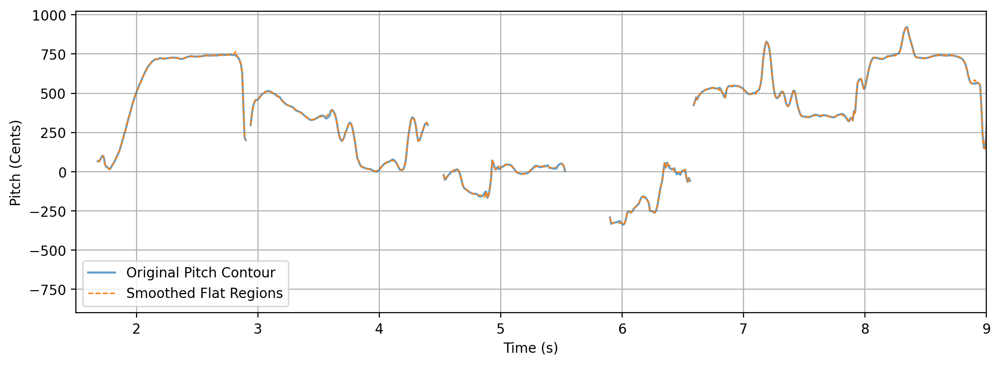

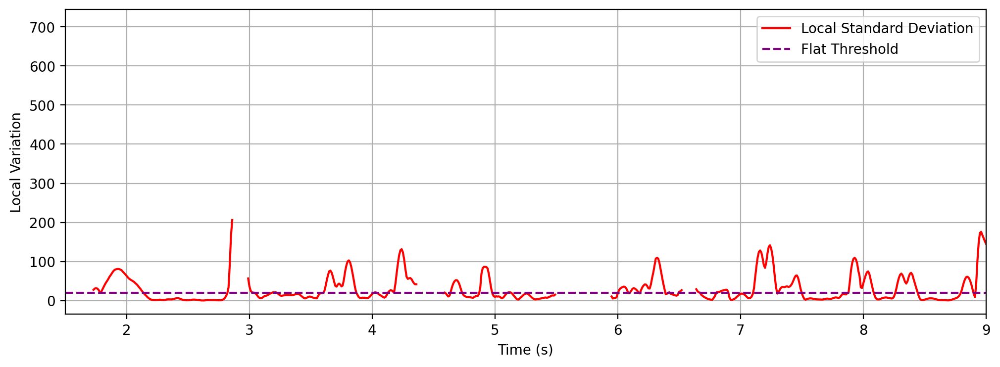

In [24]:
flat_threshold = 20
start_time = 1.5
end_time = 9

def flatten_flat_regions(pitch_contour, sr, window_length=10, flat_threshold=5, smooth_window=15):
    smoothed_contour = np.copy(pitch_contour)
    half_window = window_length // 2

    # Compute local standard deviation as a measure of variation
    local_std = np.array([
        np.std(pitch_contour[max(0, i-half_window):min(len(pitch_contour), i+half_window)])
        for i in range(len(pitch_contour))
    ])
    
    # Smooth flat regions
    flat_indices = local_std < flat_threshold
    if np.any(flat_indices):
        smoothed_flat = savgol_filter(pitch_contour, window_length=smooth_window, polyorder=2, mode='nearest')
        smoothed_contour[flat_indices] = smoothed_flat[flat_indices]

    return smoothed_contour, local_std


# Process the contour
smoothed_contour, local_std = flatten_flat_regions(f0_crepe_cents, sr_nov, flat_threshold=flat_threshold)

min_cents = -900
max_cents = np.nanmax(f0_crepe_cents[int(start_time * sr_nov):int(end_time * sr_nov)]) + 100

# Plot results
plt.figure(figsize=(12, 4))
plt.plot(times_crepe, f0_crepe_cents, label='Original Pitch Contour', alpha=0.7)
plt.plot(times_crepe, smoothed_contour, label='Smoothed Flat Regions', linewidth=1, linestyle='--')
plt.xlabel('Time (s)')
plt.ylabel('Pitch (Cents)')
plt.legend()
plt.grid()
plt.xlim([start_time, end_time])
plt.ylim([min_cents, max_cents])
plt.show()

# Plot local variation
plt.figure(figsize=(12, 4))
plt.plot(times_crepe, local_std, label='Local Standard Deviation', color='red')
plt.axhline(flat_threshold, color='purple', linestyle='--', label='Flat Threshold')
plt.xlabel('Time (s)')
plt.ylabel('Local Variation')
plt.xlim([start_time, end_time])
plt.legend()
plt.grid()
plt.show()


In [25]:
def complement_intervals(intervals, total_start, total_end):
    intervals = np.array(sorted(intervals))  # Sort and convert to NumPy array
    starts, ends = intervals[:, 0], intervals[:, 1]

    # Compute gaps between intervals
    gaps_start = np.concatenate(([total_start], ends))
    gaps_end = np.concatenate((starts, [total_end]))

    # Select valid gaps (where start < end)
    complement = np.column_stack((gaps_start, gaps_end))
    complement = complement[complement[:, 0] < complement[:, 1]]

    return complement.tolist()

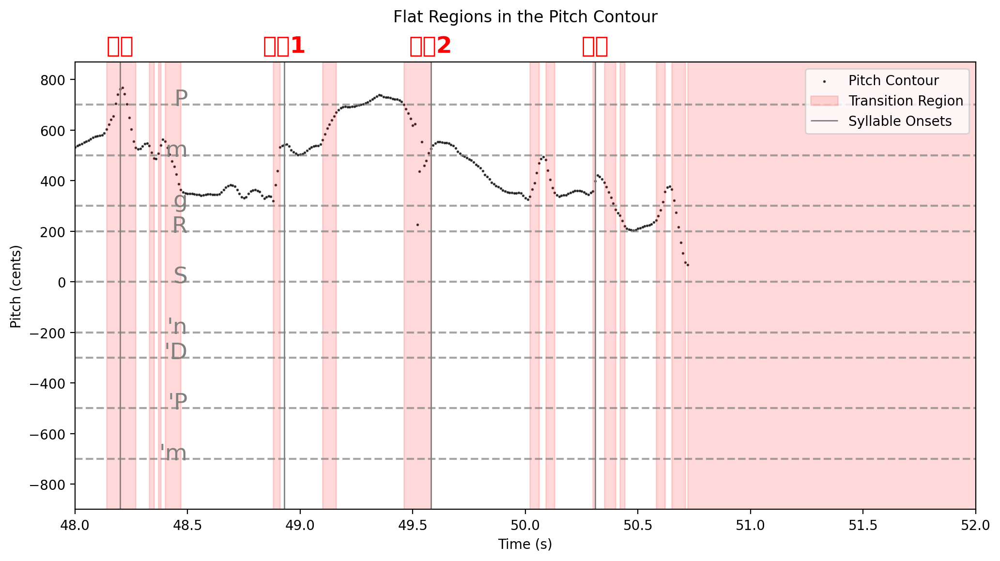

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# === PARAMETERS ===
window_size = int(0.03 * sr_nov)  # 30 ms window
hop_size = 1  # Hop size (2 samples)
sd_threshold = 10  # Standard deviation threshold for flatness
# slope_threshold = 1000  # Slope threshold for flatness

start_time = 48
end_time = 52
min_cents = -900
max_cents = np.nanmax(f0_crepe_cents[int(start_time * sr_nov):int(end_time * sr_nov)]) + 100

# === SEGMENT INTO OVERLAPPING WINDOWS AND ANALYZE ===
num_windows = (len(times_crepe) - window_size) // hop_size + 1
flat_regions = []

for i in range(num_windows):
    start = i * hop_size
    end = start + window_size

    segment = f0_crepe_cents[start:end]
    t_segment = times_crepe[start:end]

    # Ignore unvoiced samples (-inf)
    voiced_indices = segment > -np.inf
    segment_voiced = segment[voiced_indices]
    t_segment_voiced = t_segment[voiced_indices]

    if len(segment_voiced) < 2:
        continue

    # Compute statistics on voiced samples only
    # mean_f0 = np.mean(segment_voiced)

    sd_f0 = np.std(segment_voiced)
    # slope_f0 = (segment_voiced[-1] - segment_voiced[0]) / (t_segment_voiced[-1] - t_segment_voiced[0])

    # Detect flat regions
    if sd_f0 < sd_threshold:
        flat_regions.append((t_segment_voiced[0], t_segment_voiced[-1]))


# === GROUP CONTIGUOUS FLAT REGIONS ===
contiguous_regions = []
current_region = None

for start_t, end_t in flat_regions:
    if current_region is None:
        current_region = [start_t, end_t]
    else:
        # Check if the current region is contiguous (gap <= hop size in time)
        if start_t - current_region[1] <= hop_size / sr_nov:
            current_region[1] = end_t  # Extend the current region
        else:
            contiguous_regions.append(tuple(current_region))
            current_region = [start_t, end_t]

# Add the last region
if current_region is not None:
    contiguous_regions.append(tuple(current_region))
    

# === PLOT RESULTS ===
plt.figure(figsize=(12, 6))
plt.scatter(times_crepe, f0_crepe_cents, label="Pitch Contour", color="black", alpha=0.7, s = 1)

# Shade contiguous flat regions (light red)

transition_regions = complement_intervals(contiguous_regions, 0.0, duration)

for start_t, end_t in transition_regions:
    plt.axvspan(start_t, end_t, color='red', alpha=0.15, label="Transition Region")

# Shade individual flat regions (green)
# for start_t, end_t in flat_regions:
#     plt.axvspan(start_t, end_t, color='green', alpha=0.3, label="Flat Region")

sam_onset_ymin = min_cents
sam_onset_ymax = max_cents
man_onset_ymin = min_cents
man_onset_ymax = max_cents

plt.vlines(manual_onsets_plot, man_onset_ymin, man_onset_ymax, color='gray', label="Syllable Onsets", linewidth = 1)
for cent, label in zip(note_cents_eq, raga_cent_labels_eng):
    if cent>min_cents and cent<max_cents:
        plt.axhline(cent, color='gray', linestyle='--', alpha=0.7)
        plt.text(start_time + 0.5, cent+20, label, ha='right', va='center', fontsize=17, color='gray')
# Onset labels
for x, label in zip(manual_onsets_plot, manual_labels_plot):
    if start_time <= x <= end_time:
        plt.text(x, max_cents+20, s=label, ha='center', va='bottom', fontsize=17, color='red', fontweight='bold')


plt.xlabel("Time (s)")
plt.ylabel("Pitch (cents)")
plt.title("Flat Regions in the Pitch Contour", pad=30)
plt.xlim([start_time, end_time])
plt.ylim([min_cents, max_cents])

# Handle legend (avoid duplicate labels)
handles, labels = plt.gca().get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))
plt.legend(unique_labels.values(), unique_labels.keys())

plt.show()

### Note Quantisation

In [27]:
import numpy as np
import matplotlib.pyplot as plt

# === PARAMETERS ===
window_size = int(0.03 * sr_nov)  # 30 ms window
hop_size = 1
start_time, end_time = 1.68, 3
sd_threshold, slope_threshold = 10, 1000
cents_threshold = 35

# Get min and max cents for plotting
min_cents = np.nanmin(f0_crepe_cents[(f0_crepe_cents != -np.inf) & (np.arange(len(f0_crepe_cents)) >= int(start_time * sr_nov)) & (np.arange(len(f0_crepe_cents)) < int(end_time * sr_nov))]) - 100
max_cents = np.nanmax(f0_crepe_cents[int(start_time * sr_nov):int(end_time * sr_nov)]) + 100

# === STEP 1: Create raw_notes with adaptive thresholds ===
raw_notes = []
for pitch in f0_crepe_cents:
    diffs = note_cents_eq - pitch
    min_idx = np.argmin(np.abs(diffs))

    # Determine adaptive thresholds
    neg_thresh = pos_thresh = cents_threshold

    if min_idx > 0:
        prev_gap = abs(note_cents_eq[min_idx] - note_cents_eq[min_idx - 1])
        if prev_gap >= 150:
            neg_thresh *= 2

    if min_idx < len(note_cents_eq) - 1:
        next_gap = abs(note_cents_eq[min_idx] - note_cents_eq[min_idx + 1])
        if next_gap >= 150:
            pos_thresh *= 2

    # Check pitch within adaptive range
    if -neg_thresh <= diffs[min_idx] <= pos_thresh:
        raw_notes.append((note_cents_eq[min_idx], raga_cent_labels[min_idx], neg_thresh, pos_thresh))
    elif pitch == -np.inf:
        raw_notes.append((pitch, "U", cents_threshold, cents_threshold))
    else:
        raw_notes.append((pitch, "T", cents_threshold, cents_threshold))

# === STEP 2: Create contiguous_notes ===
contiguous_notes, start_tt, current_note = [], times_crepe[0], raw_notes[0]

for i in range(1, len(raw_notes)):
    if raw_notes[i][1] != current_note[1]:
        contiguous_notes.append((start_tt, times_crepe[i - 1], current_note))
        start_tt, current_note = times_crepe[i], raw_notes[i]
# Last segment
contiguous_notes.append((start_tt, times_crepe[-1], current_note))


### Plotting

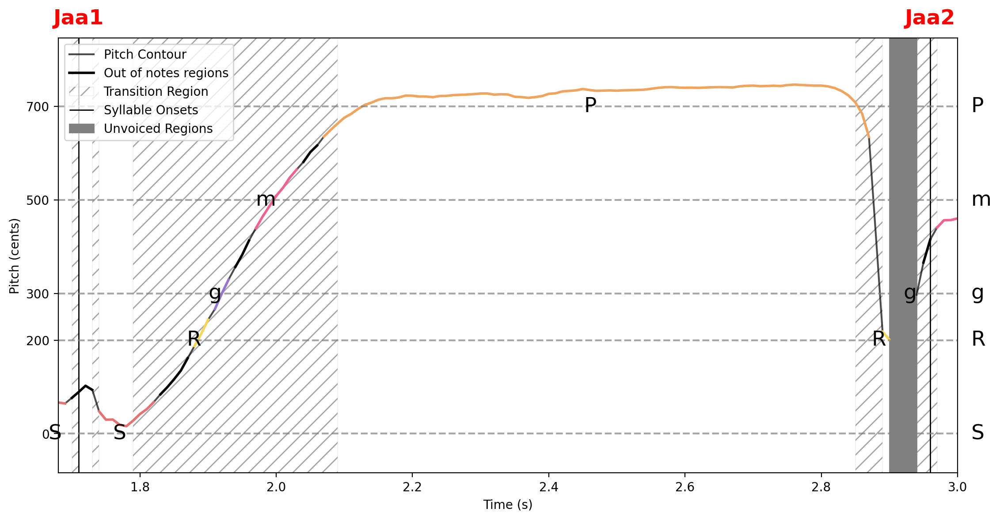

In [28]:
# === UPDATED PLOT RESULTS ===
plt.figure(figsize=(12, 6))

plt.plot(times_crepe, f0_crepe_cents, label="Pitch Contour", color="black", alpha=0.7)

# Color pitch contour by notes
for start, end, (note_f, label, neg_thresh, pos_thresh) in contiguous_notes:
    segment_mask = (times_crepe >= start) & (times_crepe <= end)

    x = times_crepe[segment_mask]
    y_seg = f0_crepe_cents[segment_mask]

    if x.size == 0:
        continue  # Skip if segment has no valid data

    # For continuous lines without visible breaks
    if label != 'T':
        plt.plot(x, y_seg, color=color_dict[label] , linewidth=2)
    else:
        plt.plot(x, y_seg, color='black', linewidth=2, label='Out of notes regions')

    # Label notes in center of the segment
    mid_time = (start + end) / 2
    if start_time <= mid_time and mid_time <= end_time and (label != "T" and label != "U"):
        plt.text(mid_time, note_f, raga_cent_labels_dict[label],
                 ha='right', va='center', fontsize=17, color='black')


# Transition regions with pattern
for i, j in transition_regions:
    if start_time <= i and j <= end_time:
        plt.fill_between([i, j], min_cents, max_cents, color='none', 
                         edgecolor='gray', hatch='//', linewidth=0.1, alpha=0.7,
                         label='Transition Region')

# Plot syllable onsets
plt.vlines(manual_onsets_plot, min_cents, max_cents, color='black', linewidth=1, label="Syllable Onsets")

# Plot note lines and labels for sargam y axis
text_x_pos = end_time + 0.015 * (end_time - start_time)
for cent, label in zip(note_cents_eq, raga_cent_labels_eng):
    if min_cents < cent < max_cents:
        plt.axhline(cent, color='gray', linestyle='--', alpha=0.7)
        plt.text(text_x_pos, cent, label,
                 ha='left', va='center', fontsize=17, color='black', clip_on=False)

# Onset labels
for x, label in zip(manual_onsets_plot, [ja_jare_eng_dict[i] for i in manual_labels_plot]):
    if start_time <= x <= end_time:
        plt.text(x, max_cents + 20, s=label,
                 ha='center', va='bottom', fontsize=17, color='red', fontweight='bold')

# Unvoiced regions
for i, j in unvoiced_intervals:
    if start_time <= i and j <= end_time:
        plt.axvspan(i, j, color='gray', alpha=1, label='Unvoiced Regions')

plt.xlabel("Time (s)")
plt.ylabel("Pitch (cents)")
# plt.title("Pitch Contour Colored by Detected Notes", pad=30)
plt.yticks(note_cents_eq)
plt.xlim([start_time, end_time])
plt.ylim([min_cents, max_cents])
# Unique legend handling
handles, labels = plt.gca().get_legend_handles_labels()
unique_legend = dict(zip(labels, handles))
plt.legend(unique_legend.values(), unique_legend.keys(), loc='upper left', fontsize=10)

plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()


plotting

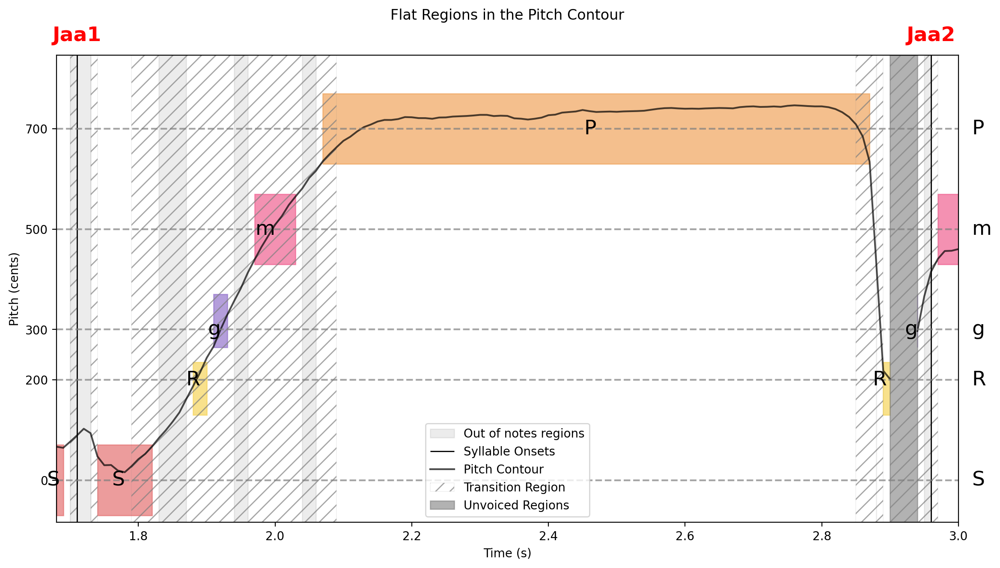

In [29]:
# === PLOT RESULTS ===
plt.figure(figsize=(12, 6))

for start, end, (note_f, label, neg_thresh, pos_thresh) in contiguous_notes:
    if label != 'T':
        y_min, y_max = note_f - neg_thresh, note_f + pos_thresh
        color, alpha = color_dict[label], 0.7
        lbl = None
    else:
        y_min, y_max = min_cents, max_cents
        color, alpha = 'gray', 0.15
        lbl = 'Out of notes regions'  

    plt.axvspan(start, end, ymin=(y_min - min_cents) / (max_cents - min_cents),
                ymax=(y_max - min_cents) / (max_cents - min_cents),
                color=color, alpha=alpha, label = lbl)

    # Display note labels within plotting interval
    if start_time <= (start + end) / 2 <= end_time and label != "T" and label != "U":
        plt.text((start + end) / 2, note_f, raga_cent_labels_dict[label],
                 ha='right', va='center', fontsize=17, color='black')
        

# Plot syllable onsets
plt.vlines(manual_onsets_plot, min_cents, max_cents, color='black', linewidth=1, label="Syllable Onsets")

plt.plot(times_crepe, f0_crepe_cents, label="Pitch Contour", color="black", alpha=0.7)



text_x_pos = end_time + 0.015 * (end_time - start_time)  # 5% offset to the right of plot
# Plot note lines and labels
for cent, label in zip(note_cents_eq, raga_cent_labels_eng):
    if min_cents < cent < max_cents:
        plt.axhline(cent, color='gray', linestyle='--', alpha=0.7)
        plt.text(text_x_pos, cent, label,
                 ha='left', va='center', fontsize=17, color='black', clip_on=False)
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust right padding to prevent clipping

# Transition regions
for i, j in transition_regions:
    if start_time <= i and j <= end_time:
        plt.fill_between([i, j], min_cents, max_cents, color='none', edgecolor='gray', hatch='//', linewidth=0.1, alpha=0.7, label='Transition Region')

# Onset labels
for x, label in zip(manual_onsets_plot, [ja_jare_eng_dict[i] for i in manual_labels_plot]):
    if start_time <= x <= end_time:
        plt.text(x, max_cents + 20, s=label,
                 ha='center', va='bottom', fontsize=17, color='red', fontweight='bold')
        
# Unvoiced regions
for i, j in unvoiced_intervals:
    if start_time <= i and j <= end_time:
        plt.axvspan(i, j, color='gray', alpha=0.6, label='Unvoiced Regions')


plt.xlabel("Time (s)")
plt.ylabel("Pitch (cents)")
plt.title("Flat Regions in the Pitch Contour", pad=30)
plt.yticks(note_cents_eq)
plt.xlim([start_time, end_time])
plt.ylim([min_cents, max_cents])

# Unique legend
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(dict(zip(labels, handles)).values(), dict(zip(labels, handles)).keys())

plt.show()

In [30]:
def get_segments(times, quantized):
    segments = []
    start = times[0]
    prev = quantized[0]

    for t, q in zip(times[1:], quantized[1:]):
        if q != prev:
            if prev != -np.inf:
                segments.append((start, t, prev))
            start = t
            prev = q

    if prev != -np.inf:
        segments.append((start, times[-1], prev))
    return segments

Quantised version for computation

In [31]:
# pitch contour quantisation to nearest raga note

import numpy as np

def quantize_pitch_contour(pitch_cents, bins_cents):
    """
    Quantizes a pitch contour (in cents) to the nearest value from a list of bins.

    Parameters:
        pitch_cents (np.ndarray): Array of pitch values in cents. Can contain -np.inf for unvoiced.
        bins_cents (list or np.ndarray): List of bin center values in cents.

    Returns:
        np.ndarray: Quantized pitch contour with -inf preserved for unvoiced.
    """
    bins = np.array(bins_cents)
    quantized = np.copy(pitch_cents)

    # Mask for voiced regions
    voiced_mask = (pitch_cents != -np.inf)

    # For each voiced pitch, find the nearest bin
    voiced_vals = pitch_cents[voiced_mask]
    nearest_bins = bins[np.argmin(np.abs(voiced_vals[:, np.newaxis] - bins), axis=1)]

    quantized[voiced_mask] = nearest_bins

    return quantized
quantized_pitch_contour = quantize_pitch_contour(f0_crepe_cents, note_cents_eq)


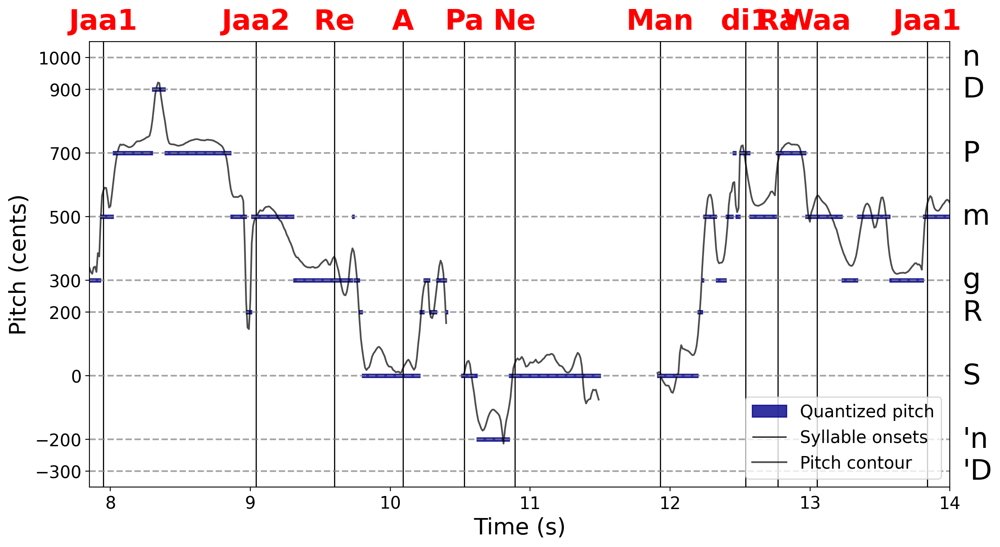

In [32]:
# === PLOT RESULTS ===
plt.figure(figsize=(12, 6))

min_cents = -300 - 50
max_cents = 1000 + 50

start_time, end_time = 7.95, 14

note_thickness = 10
contiguous_notes_qnt = get_segments(times_crepe, quantized_pitch_contour)

for start, end, note_f in contiguous_notes_qnt:
    # y_min, y_max = note_f - neg_thresh, note_f + pos_thresh
    y_min, y_max = note_f - note_thickness/2, note_f + note_thickness/2

    plt.axvspan(start, end, ymin=(y_min - min_cents) / (max_cents - min_cents),
                ymax=(y_max - min_cents) / (max_cents - min_cents),
                color="darkblue", alpha=0.8, label = "Quantized pitch")

    # # Display note labels within plotting interval
    # if start_time <= (start + end) / 2 <= end_time and label != "T":
    #     plt.text((start + end) / 2, note_f, label, fontproperties=hindi_font,
    #              ha='right', va='center', fontsize=17, color='black')
        

# Plot syllable onsets
plt.vlines(manual_onsets_plot, min_cents, max_cents, color='black', linewidth=1, label="Syllable onsets")

plt.plot(times_crepe, f0_crepe_cents, label="Pitch contour", color="black", alpha=0.7)

# plt.plot(times_crepe, quantized_pitch_contour, label="Pitch Contour", color="darkblue", alpha=0.4)

# plot quantised notes as midi notes


text_x_pos = end_time + 0.015 * (end_time - start_time)  # 5% offset to the right of plot
# Plot note lines and labels
for cent, label in zip(note_cents_eq, raga_cent_labels_eng):
    if min_cents < cent < max_cents:
        plt.axhline(cent, color='gray', linestyle='--', alpha=0.7)
        plt.text(text_x_pos, cent, label,
                 ha='left', va='center', fontsize=25, color='black', clip_on=False)
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust right padding to prevent clipping

# # Transition regions
# for i, j in transition_regions:
#     if start_time <= i and j <= end_time:
#         plt.fill_between([i, j], min_cents, max_cents, color='none', edgecolor='gray', hatch='//', linewidth=0.1, alpha=0.7, label='Transition Region')

# Onset labels
for x, label in zip(manual_onsets_plot, [ja_jare_eng_dict[i] for i in manual_labels_plot]):
    if start_time <= x <= end_time:
        plt.text(x, max_cents + 20, s=label,
                 ha='center', va='bottom', fontsize=25, color='red', fontweight='bold')
        
# # Unvoiced regions
# for i, j in unvoiced_intervals:
#     if start_time <= i and j <= end_time:
#         plt.axvspan(i, j, color='gray', alpha=0.6, label='Unvoiced Regions')


plt.xlabel("Time (s)", fontsize=20)
plt.ylabel("Pitch (cents)", fontsize=20)
# plt.title("Flat regions in the pitch contour", pad=30)
plt.yticks(note_cents_eq, fontsize=15)
plt.xticks(fontsize=15)
plt.xlim([start_time-0.1, end_time])
plt.ylim([min_cents, max_cents])

# Unique legend
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(dict(zip(labels, handles)).values(), dict(zip(labels, handles)).keys(), loc ='lower right', fontsize=15)

plt.show()

In [33]:
id_syl_dict = dict(zip(id_list, syl_list))
id_syl_dict

{'C1L1B7': 'जा1',
 'C1L2B9': 'जा2',
 'C1L2B11': 'रे',
 'C1L2B13': 'अ',
 'C1L2B14': 'प',
 'C1L2B15': 'ने',
 'C2L1B1': 'मं',
 'C2L1B3': 'दि1',
 'C2L1B4': 'र',
 'C2L1B5': 'वा'}

paper ke liye plot

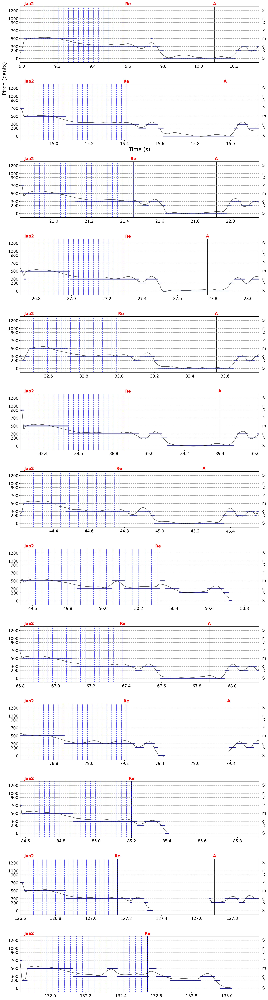

In [38]:
# === PLOT RESULTS ===
min_cents = -100
max_cents = 1300

syllable = "C1L2B9"
syllable_segments = []
syllable_intervals = []
manual_dict = dict(zip(manual_onsets_plot, manual_labels_plot))

# Get start and stop stamps for the syllable
start_stamps = []
stop_stamps = []
for index, onset in enumerate(manual_onsets_plot):
    if manual_dict[onset] == id_syl_dict[syllable]:
        start_stamps.append(onset)
        if index != len(manual_onsets_plot) - 1:
            if manual_onsets_plot[index + 1] - onset > 4.5:
                stop_stamps.append(min(manual_onsets_plot[index + 1], onset + alotted_beats[syllable] * one_matra_interval))
            else:
                stop_stamps.append(manual_onsets_plot[index + 1])

# Get syllable segments and intervals
for start, stop in zip(start_stamps, stop_stamps):
    segment = quantized_pitch_contour[int(start * sr_nov):int(stop * sr_nov)]
    syllable_segments.append(segment)
    syllable_intervals.append([start, stop])

# Plot syllable intervals
num_plots = 14
ctr = 1
plt.figure(figsize=(15, 4*num_plots))
for start_time, end_time in syllable_intervals[1:]:
    plt.subplot(num_plots, 1, ctr)

    # Plot quantized pitch
    contiguous_notes_qnt = get_segments(times_crepe, quantized_pitch_contour)
    note_thickness = 16
    for start, end, note_f in contiguous_notes_qnt:
        y_min, y_max = note_f - note_thickness / 2, note_f + note_thickness / 2
        plt.axvspan(start, end, ymin=(y_min - min_cents) / (max_cents - min_cents),
                    ymax=(y_max - min_cents) / (max_cents - min_cents),
                    color="darkblue", alpha=0.8, label="Quantized pitch")

    # Plot pitch contour
    plt.plot(times_crepe, f0_crepe_cents, label="Pitch contour", color="black", alpha=0.7)

    # Plot syllable onsets
    plt.vlines(manual_onsets_plot, min_cents, max_cents, color='black', linewidth=1, label="Syllable onsets")

    # Plot note lines and labels
    text_x_pos = start_time + 1.3 + 0.015 * (start_time + 1.3 - start_time)
    for cent, label in zip(note_cents_eq, raga_cent_labels_eng):
        if min_cents < cent < max_cents:
            plt.axhline(cent, color='gray', linestyle='--', alpha=0.7)
            plt.text(text_x_pos, cent, label,
                     ha='left', va='center', fontsize=15, color='black', clip_on=False)

    # Plot onset labels
    for x, label in zip(manual_onsets_plot, [ja_jare_eng_dict[i] for i in manual_labels_plot]):
        if start_time <= x <= start_time + 1.3:
            plt.text(x, max_cents + 20, s=label,
                     ha='center', va='bottom', fontsize=15, color='red', fontweight='bold')

    # Plot bins
    bins = np.linspace(start_time, end_time, int(alotted_beats[syllable] * 10 + 1))
    for i in bins:
        plt.axvline(i, ymin=0, ymax=1, color="blue", linestyle="--", alpha=0.7)

    plt.tight_layout(rect=[0, 0, 0.95, 1], pad=1.8)
    plt.yticks(note_cents_eq, fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim([start_time-0.05, start_time + 1.3])
    plt.ylim([min_cents, max_cents])

    if ctr == 2:
        ylbl = plt.ylabel("Pitch (cents)", fontsize = 20)
        ylbl.set_position((0, 1.1))
        
    if ctr == 2:
        plt.xlabel("Time (s)", fontsize = 20)

    ctr += 1


plt.show()

In [ ]:
from typing import List

In [ ]:
def remove_trailing_neg_inf(arr):
    # Ensure the array is a NumPy array with dtype float for comparison
    arr = np.asarray(arr, dtype=float)
    # Identify the indices where the value is not -inf
    not_neg_inf = arr != -np.inf
    # Find the position of the last non -inf value
    if np.any(not_neg_inf):
        last_valid_index = np.max(np.where(not_neg_inf[:-4])) # Exclude the last 4 elements
        # Slice the array up to the last valid index
        return arr[:last_valid_index + 1].astype("str")
    else:
        # If all values are -inf, return an empty array
        return np.array([])
    
def resample_to_bins(label_seq: List[str], n_bins: int) -> List[str]:
    total_len = len(label_seq)
    bin_size = total_len / n_bins
    resampled = []
    for i in range(n_bins):
        start = int(i * bin_size)
        end = int((i + 1) * bin_size)
        bin_labels = list(label_seq[start:end]) if end > start else [label_seq[start]]
        most_common = max(set(bin_labels), key=bin_labels.count)
        resampled.append(most_common)
    return resampled


Multiple occurances of a syllable/line

[700. 700. 700. 700. 700. 700. 700. 700. 700. 700. 700. 700. 700. 700.
 700. 700. 700. 700. 700. 500. 500. 500.]
[ 700.  700.  700.  700.  700.  700.  700.  700.  700.  700.  700.  700.
  700.  700.  700.  700.  700.  900.  900.  900. 1000. 1000. 1000. 1000.
 1000. 1000. 1000. 1000. 1000.  900.  900.  900.  900.  900.  900.  900.
  900.  900.  900.  900.  900.  900.  900.  900.  900. 1000.]
[1000. 1000. 1000. 1000. 1000. 1000. 1000. 1000. 1000. 1000. 1000. 1000.
 1000. 1000. 1000. 1000. 1000. 1000. 1000.  900.  900.  900.  900.  900.
 1000. 1000. 1000. 1000. 1000. 1000. 1000. 1000.]
[500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. -inf -inf -inf 700. 700.]
[500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500.]
time: 11.5 11.72
plot 11.5 11.72
11.5 11.5 11.72
11.5 11.72 11.72
[11.5   11.522 11.544

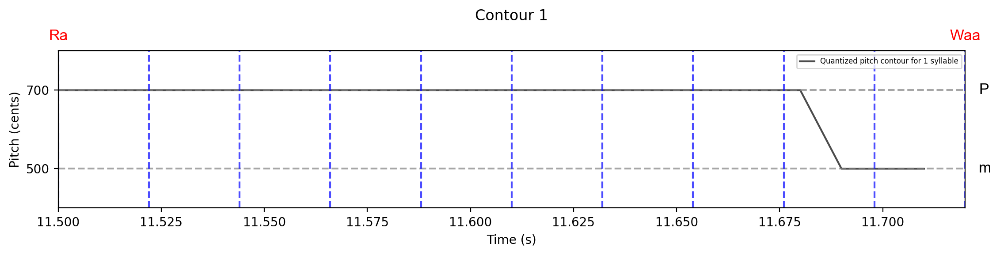

time: 16.36 16.82
plot 16.36 16.83
16.36 16.36 16.83
16.36 16.83 16.83
[16.36  16.406 16.452 16.498 16.544 16.59  16.636 16.682 16.728 16.774
 16.82 ]


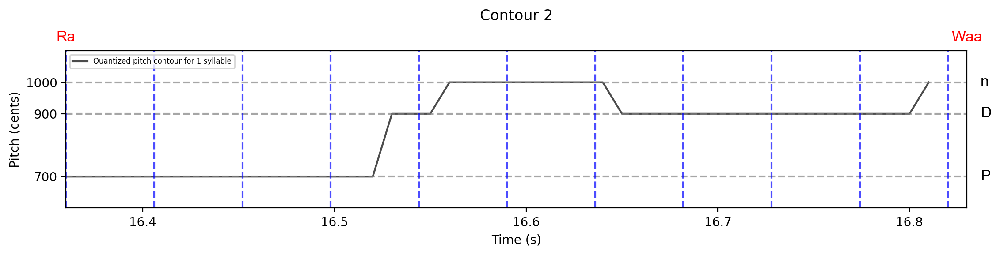

time: 21.81 22.13
plot 21.81 22.13
21.81 21.81 22.13
21.81 22.13 22.13
[21.81  21.842 21.874 21.906 21.938 21.97  22.002 22.034 22.066 22.098
 22.13 ]


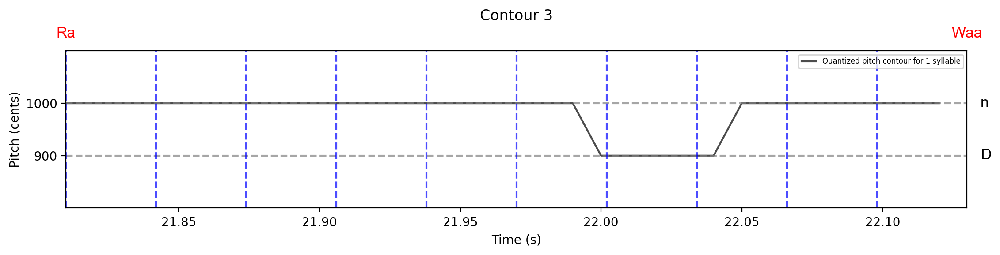

time: 26.51 26.85
plot 26.51 26.85
26.51 26.51 26.85
26.51 26.85 26.85
[26.51  26.544 26.578 26.612 26.646 26.68  26.714 26.748 26.782 26.816
 26.85 ]


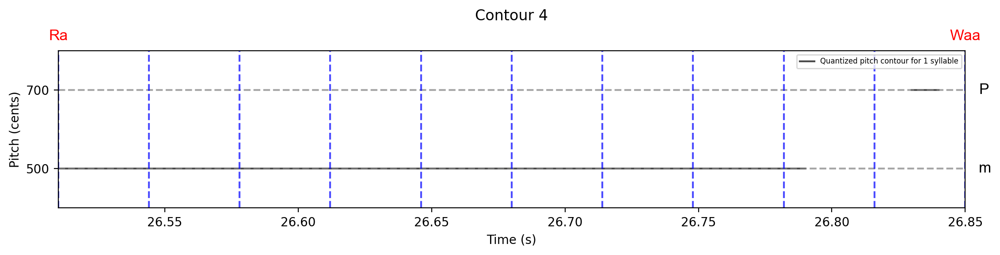

time: 41.69 41.98
plot 41.69 41.98
41.69 41.69 41.98
41.69 41.98 41.98
[41.69  41.719 41.748 41.777 41.806 41.835 41.864 41.893 41.922 41.951
 41.98 ]


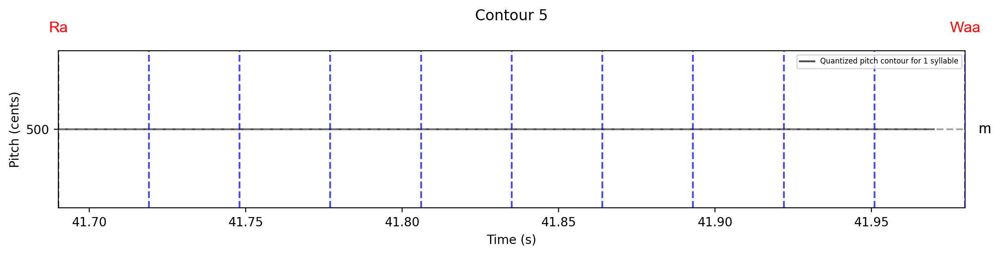

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# syllable = "जा1"
margin = 0.0  # margin around syllable occurrences
manual_dict = dict(zip(manual_onsets_plot, manual_labels_plot))

# indices = [i for i, lbl in enumerate(manual_labels_plot) if lbl == syllable]
# syllable_intervals = [(manual_onsets_plot[i], manual_onsets_plot[i + 1] if i + 1 < len(manual_onsets_plot) else times_crepe[-1]) for i in indices]

# === PITCH CONTOURS OF ONE SYLLABLE ===

syllable_segments = []
syllable_intervals = []

# observations_per_id_copy = copy.deepcopy(observations_per_id)
# label_map_no_NA = [line for lines in observations_per_id_copy.values() for line in lines]
# # Sort the list
# sorted_label_map = sorted(label_map_no_NA, key=lambda x: x[0][0])

# for line in observations_per_id[syllable]:
#     st_samp = int(line[0][0]*sr_nov)
#     next_index = sorted_label_map.index(line) + 1
#     next_line = sorted_label_map[next_index] if next_index < len(sorted_label_map) else None
#     if next_line is not None:
#         end_samp =  min(int(next_line[0][0]*sr_nov), st_samp + int(alotted_beats[syllable]*sr_nov*line[1][4]))
#     else:
#         end_samp = st_samp + min(int(line[0][1]*sr_nov), int(alotted_beats[syllable]*sr_nov*line[1][4]))
    # segment = quantized_pitch_contour[st_samp:end_samp]
    # syllable_intervals.append([st_samp/sr_nov, end_samp/sr_nov])
    # syllable_segments.append(segment)
    # print(st_samp, end_samp)
    # print(segment)

syllable = "C2L1B4"

start_stamps = []
stop_stamps = []

for index, onset in enumerate(manual_onsets_plot):
    if manual_dict[onset]==id_syl_dict[syllable]:
        if index != len(manual_onsets_plot) - 1:
            start_stamps.append(onset)

            next_onset = manual_onsets_plot[index + 1] if (manual_onsets_plot[index + 1]) else (quantized_pitch_contour[-1] / sr_nov)
            start_idx = int(onset * sr_nov)
            end_idx = int(next_onset * sr_nov)
            segment = quantized_pitch_contour[start_idx:end_idx]

            # Detect silence of >200ms = 20 consecutive -inf
            silence_len = 20
            break_point = None
            count = 0

            for i, val in enumerate(segment):
                if val == float('-inf'):
                    count += 1
                    if count >= silence_len:
                        break_point = i - silence_len + 1  # first index of silent region
                        break
                else:
                    count = 0

            if break_point is not None:
                stop_stamps.append(onset + break_point / sr_nov)
            else:
                stop_stamps.append(next_onset)

for start, stop in zip(start_stamps, stop_stamps):
    segment = quantized_pitch_contour[int(start*sr_nov): int(stop*sr_nov)]
    # segment = remove_trailing_neg_inf(segment)
    syllable_segments.append(segment)
    syllable_intervals.append([start, start + len(segment)/sr_nov])
    print(segment)

n_bins = alotted_beats[syllable]*10
resampled_segments = []


for currIndex, segment in enumerate(syllable_segments):
    resampled_segment = resample_to_bins(segment.astype("str"), n_bins)
    resampled_segments.append(resampled_segment)


ctr = 1


for start_time, end_time in syllable_intervals:
    print("time:", start_time, end_time)
    # end_time+=3
    plt.figure(figsize=(12, 3))

    plot_start, plot_end = max(0, start_time - margin), min(stop_stamps[ctr-1] + margin, duration)
    print("plot", plot_start, plot_end)
    

    # valid_cents = f0_crepe_cents[(f0_crepe_cents != -np.inf) & (times_crepe >= plot_start) & (times_crepe <= plot_end)]
    valid_cents = quantized_pitch_contour[int(sr_nov*plot_start):int(sr_nov*plot_end)]
    valid_cents = valid_cents[valid_cents != -np.inf]
    min_cents = np.nanmin(valid_cents) - 100
    max_cents = np.nanmax(valid_cents) + 100 

    plt.plot(times_crepe[int(sr_nov*plot_start):int(sr_nov*plot_end)], quantized_pitch_contour[int(sr_nov*plot_start):int(sr_nov*plot_end)] , label="Quantized pitch contour for 1 syllable", color="black", alpha=0.7)

    # plt.plot(times_crepe[(times_crepe >= plot_start) & (times_crepe <= plot_end)],
    #     f0_crepe_cents[(times_crepe >= plot_start) & (times_crepe <= plot_end)],
    #     label="Pitch Contour", color="black", alpha=0.7)
    # for seg_start, seg_end, (note_f, label, neg_thresh, pos_thresh) in contiguous_notes:
    #     if seg_end < plot_start or seg_start > plot_end:
    #         continue
    #     segment_mask = (times_crepe >= seg_start) & (times_crepe <= seg_end)
    #     if label != 'T':
    #         plt.plot(times_crepe[segment_mask], f0_crepe_cents[segment_mask], 
    #                 color=color_dict[label], linewidth=2)
    #     else:
    #         plt.plot(times_crepe[segment_mask], f0_crepe_cents[segment_mask],
    #                 color='gray', linewidth=2, alpha=1, label='Out of notes regions')

    #     # Display note labels within plotting interval
    #     if plot_start <= (seg_start + seg_end) / 2 <= plot_end and label != "T":
    #         plt.text((seg_start + seg_end) / 2, note_f, label, fontproperties=hindi_font,
    #                 ha='right', va='center', fontsize=17, color='black')



    text_x_pos = plot_end + 0.015 * (plot_end - plot_start)
    for cent, label in zip(note_cents_eq, raga_cent_labels_eng):
        if min_cents < cent < max_cents:
            plt.axhline(cent, color='gray', linestyle='--', alpha=0.7)
            plt.text(text_x_pos, cent, label, fontproperties=hindi_font,
                     ha='left', va='center', fontsize=17, color='black', clip_on=False)

    for x, label in zip(manual_onsets_plot, [ja_jare_eng_dict[i] for i in manual_labels_plot]):
        if plot_start <= x <= plot_end:
            print(plot_start, x, plot_end)
            plt.text(x, max_cents + 20, s=label, fontproperties=hindi_font,
                     ha='center', va='bottom', fontsize=17, color='red', fontweight='bold')
            
    bins = np.linspace(start_time, end_time, int(alotted_beats[syllable]*10 + 1))
    print(bins)
    for i in bins:
        plt.axvline(i, ymin=0, ymax=1, color="blue", linestyle="--", alpha=0.7)




    # for i, j in unvoiced_intervals:
    #     if plot_start <= i and j <= plot_end:
    #         plt.axvspan(i, j, color='gray', alpha=0.6, label='Unvoiced Regions')

    # # Transition regions
    # for i, j in transition_regions:
    #     if plot_start <= i and j <= plot_end:
    #         plt.fill_between([i, j], min_cents, max_cents, color='none', edgecolor='gray', hatch='//', linewidth=0.1, alpha=0.7, label='Transition Region')

    # plt.vlines(manual_onsets_plot, min_cents, max_cents, color='black', linewidth=1, label="Syllable Onsets")

    plt.xlabel("Time (s)")
    plt.ylabel("Pitch (cents)")
    plt.title(f"Contour {ctr}", pad = 25)
    # plt.title(f"Flat Regions in Pitch Contour around '{syllable}'", fontproperties = hindi_font, size = 15)
    plt.yticks(note_cents_eq)
    plt.xlim([plot_start, plot_end])
    plt.ylim([min_cents, max_cents])

    handles, labels = plt.gca().get_legend_handles_labels()
    plt.legend(dict(zip(labels, handles)).values(), dict(zip(labels, handles)).keys(), fontsize=6 )

    plt.tight_layout(rect=[0, 0, 0.95, 1])
    plt.show()
    ctr+=1


One plot multiple pitch contours

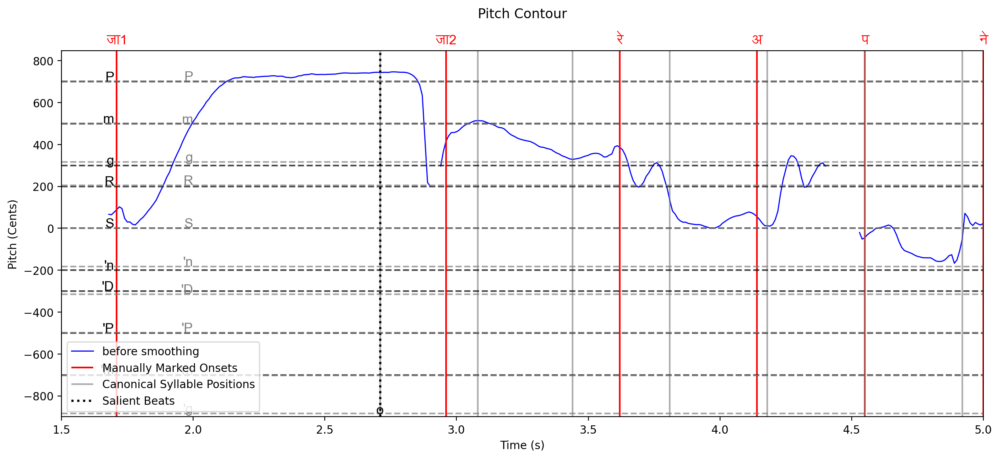

In [46]:
start_time = 1.5
end_time = 5
plt.figure(figsize=(15, 6))
plt.plot(times_crepe, f0_crepe_cents, color= 'blue', linewidth=1, label="before smoothing")
# plt.plot(times_crepe, f0_crepe_smooth, color='green', linewidth=1, label = "after smoothing")

min_cents = -900
max_cents = np.nanmax(f0_crepe_cents[int(start_time*sr_nov):int(end_time*sr_nov)]) + 100

sam_onset_ymin = min_cents
sam_onset_ymax = max_cents
man_onset_ymin = min_cents
man_onset_ymax = max_cents

plt.vlines(manual_onsets_plot, man_onset_ymin, man_onset_ymax, color='#ff0000', label="Manually Marked Onsets")
#all beat onsets 
plt.vlines(split_onsets, sam_onset_ymin, sam_onset_ymax, color = '#777777', label = "Canonical Syllable Positions", linestyles = 'solid', alpha = 0.6)
#salient beat onsets
plt.vlines(manual_tabla_onsets, sam_onset_ymin, sam_onset_ymax, color = '#000000', label = "Salient Beats", linestyles = 'dotted', linewidth = 2)
# Plot raga cent lines, scaled
for cent, label in zip(note_cents_eq, raga_cent_labels_eng):
    if cent>min_cents and cent<max_cents:
        plt.axhline(cent, color='black', linestyle='--', alpha=0.7)
        plt.text(start_time + 0.2, cent+20, label, fontproperties=hindi_font, ha='right', va='center', fontsize=17, color='black')
for cent, label in zip(note_cents_just, raga_cent_labels_eng):
    if cent>min_cents and cent<max_cents:
        plt.axhline(cent, color='gray', linestyle='--', alpha=0.7)
        plt.text(start_time + 0.5, cent+20, label, fontproperties=hindi_font, ha='right', va='center', fontsize=17, color='gray')
# Onset labels
for x, label in zip(manual_onsets_plot, manual_labels_plot):
    if start_time <= x <= end_time:
        plt.text(x, max_cents+20, s=label, fontproperties=hindi_font, ha='center', va='bottom', fontsize=17, color='red', fontweight='bold')

# sam khali text
for x, label in zip(manual_tabla_onsets, manual_tabla_labels):
    if x<start_time:
        continue
    if x>end_time:
        break
    plt.text(x, sam_onset_ymin, label,fontproperties=hindi_font, ha='center', va='bottom', fontsize=17, color='#000000')
plt.xlabel('Time (s)')
plt.ylabel('Pitch (Cents)')
plt.title('Pitch Contour', pad=30)
plt.xlim([start_time, end_time])
plt.ylim([min_cents, max_cents])
plt.legend()
plt.show()
ipd.display(ipd.Audio(audio_file, rate=sr))

In [47]:
ja_jare_eng_dict[''] = ""

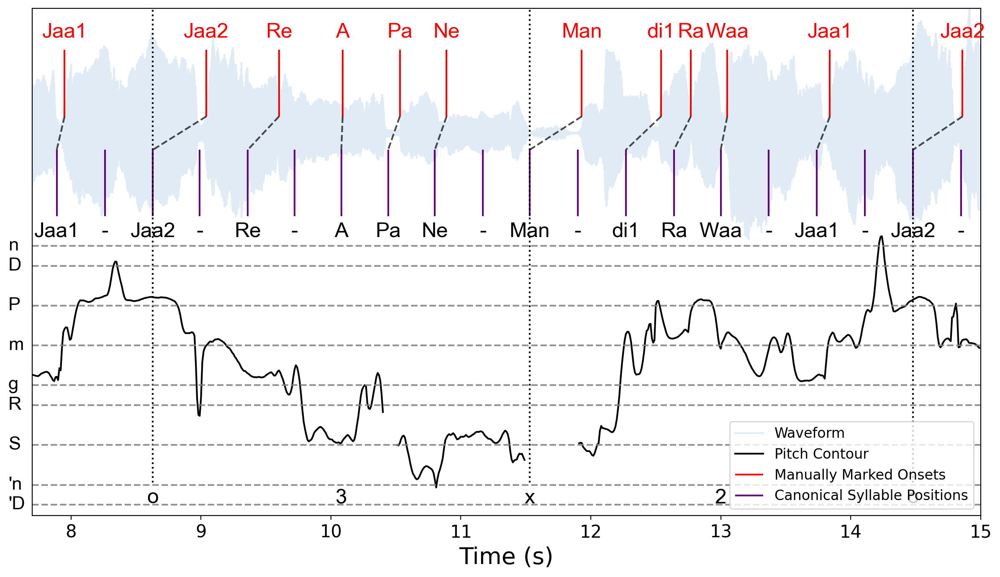

In [83]:
def combined_plot(folder, artist, time_x, freq_contour, start_time=0, end_time=20):
    y_centered = np.array(y) * 0.2 + 0.45
    time = np.arange(len(y)) / sr
    label_map_no_NA = [line for lines in observations_per_id.values() for line in lines]

    pitch_scaler = 0.35
    # Scale pitch contour
    time_mask = time_x[int(start_time*sr_nov):int(end_time*sr_nov)]
    f0_cents_trimmed = freq_contour[int(start_time*sr_nov):int(end_time*sr_nov)]
    min_cents = np.nanmin(f0_crepe_cents[(f0_crepe_cents != -np.inf) & (np.arange(len(f0_crepe_cents)) >= int(start_time * sr_nov)) & (np.arange(len(f0_crepe_cents)) < int(end_time * sr_nov))]) - 100
    max_cents = np.nanmax(f0_crepe_cents[int(start_time * sr_nov):int(end_time * sr_nov)]) + 100

    # Normalize and center pitch contour
    f0_cents_scaled = (f0_cents_trimmed - min_cents) / (max_cents - min_cents)
    f0_cents_scaled = f0_cents_scaled * pitch_scaler  # Scale to max 0.5
    f0_cents_scaled += 0.0 # Center at y = 0.25

    plt.figure(figsize=(12, 7))
    # Plot waveform
    plt.plot(time, y_centered, color='#A7C7E7', alpha=0.35, label="Waveform")
    # Plot pitch contour
    plt.plot(time_mask, f0_cents_scaled, alpha = 1, color='black', linewidth=1.5, label="Pitch Contour")

    # man_onset_ymax = 0.58 #0.28
    # man_onset_ymin = 0.38 #0.08
    # beat_onset_ymax = 0.28
    # beat_onset_ymin = 0.08
    # sam_onset_ymax = 0.8
    # sam_onset_ymin = 0
    # man_text = man_onset_ymax                        
    # can_text = beat_onset_ymin 
    # sam_text = 0.62

    man_onset_ymax = 0.55 #0.28
    man_onset_ymin = 0.47 #0.08
    beat_onset_ymax = 0.43
    beat_onset_ymin = 0.35
    sam_onset_ymax = 1
    sam_onset_ymin = 0.03
    man_text = man_onset_ymax                        
    can_text = beat_onset_ymin 
    sam_text = 0


    # Onset lines
    plt.vlines(manual_onsets_plot, man_onset_ymin, man_onset_ymax, color='#ff0000', label='Manually Marked Onsets')
    plt.vlines(split_onsets, beat_onset_ymin, beat_onset_ymax, color='#61007d', label="Canonical Syllable Positions", linestyles='solid', alpha=1)
    plt.vlines(manual_tabla_onsets, sam_onset_ymin, sam_onset_ymax, color='#000000', linestyles='dotted')

    # Onset labels
    for x, label in zip(manual_onsets_plot, [ja_jare_eng_dict[i] for i in manual_labels_plot]):
        if start_time <= x <= end_time:
            plt.text(x, man_text + 0.01, s=label, fontproperties=hindi_font, ha='center', va='bottom', fontsize=25, color='red', fontweight='bold')
    #tabla labels #redundant as vibhag labels have o and x
    # for x, label in zip(manual_tabla_onsets, manual_tabla_labels):
    #     if start_time <= x <= end_time:
    #         plt.text(x, sam_text, label, fontproperties=hindi_font, ha='center', va='bottom', fontsize=20, color='#000000')
    #vibhag labels
    for x, label in vibhag_labels_list:
        if label =="२": label = "2"
        if label == "३": label = "3"    
        if start_time <= x <= end_time:
            plt.text(x, sam_text, label, fontproperties=hindi_font, ha='center', va='bottom', fontsize=25, color='#000000')
    #canon labels
    for x, label in zip(split_onsets, [ja_jare_eng_dict[i] for i in split_onsets_labels]):
        if start_time <= x <= end_time:
            plt.text(x, can_text - 0.03, s=label, fontproperties=hindi_font, ha='center', va='bottom', fontsize=25, color='black')

    # # Plot raga cent lines, scaled
    # for cent, label in zip(note_cents_eq, raga_cent_labels_eng):
    #     if cent > min_cents and cent < max_cents+120:
    #         scaled_y = (cent - min_cents) / (max_cents - min_cents) * 0.5 + 0.0
    #         plt.axhline(y=scaled_y, color='black', linestyle='--', alpha=0.4)
    #         plt.text(start_time+0.2, scaled_y+0.01, label, fontproperties=hindi_font, ha='right', va='center', fontsize=15, color='black')

    text_x_pos = start_time - 0.025 * (end_time - start_time)
    for cent, label in zip(note_cents_eq, raga_cent_labels_eng):
        if min_cents < cent < max_cents:
            scaled_y = (cent - min_cents) / (max_cents - min_cents) * pitch_scaler + 0.0
            plt.axhline(scaled_y, color='gray', linestyle='--', alpha=0.85)
            plt.text(text_x_pos, scaled_y, label, fontproperties=hindi_font,
                    ha='left', va='center', fontsize=22, color='black', clip_on=False)

    # for cent, label in zip(note_cents_just, raga_cent_labels_eng):
    #     if cent>min_cents and cent<max_cents+120:
    #         scaled_y = (cent - min_cents) / (max_cents - min_cents) * 0.5 + 0.0
    #         plt.axhline(y=scaled_y, color='gray', linestyle='--', alpha=0.7)
    #         plt.text(start_time + 0.2, scaled_y+0.01, label, fontproperties=hindi_font, ha='right', va='center', fontsize=15, color='gray')

    # Deviation lines

    for line in label_map_no_NA:
        if line[0] != 'NA' and line[1] != 'NA':
            x_manual = line[0][0]
            x_canonincal = line[1][0]
            x_values = [x_manual, x_canonincal]
            y_values = [man_onset_ymin, beat_onset_ymax]
            plt.plot(x_values, y_values, color='black', linestyle='--', linewidth=1.5, alpha=0.7)

    # plt.title("Syllable onset deviations from canonical positions with pitch contour", fontsize=15)
    plt.ylim([-0.01, 0.6])
    plt.xlim([start_time, end_time])
    plt.yticks([], fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlabel("Time (s)", fontsize=20)
    plt.tight_layout()
    plt.legend(loc='lower right', fontsize=12)
    plt.show()

combined_plot(folder, artist, times_crepe, f0_crepe_cents, start_time = 7.7, end_time = 15)

Sonification


In [42]:
def sonify_trajectory_with_sinusoid(traj, audio_len, sr=16000, amplitude=0.3, smooth_len=11):
    """Sonification of trajectory with sinusoidal

    Notebook: C8/C8S2_FundFreqTracking.ipynb

    Args:
        traj (np.ndarray): F0 trajectory (time in seconds, frequency in Hz)
        audio_len (int): Desired audio length in samples
        sr (scalar): Sampling rate (Default value = 22050)
        amplitude (float): Amplitude (Default value = 0.3)
        smooth_len (int): Length of amplitude smoothing filter (Default value = 11)

    Returns:
        x_soni (np.ndarray): Sonification
    """
    # unit confidence if not specified
    if traj.shape[1] < 3:
        confidence = np.zeros(traj.shape[0])
        confidence[traj[:, 1] > 0] = amplitude
    else:
        confidence = traj[:, 2]

    # initialize
    x_soni = np.zeros(audio_len)
    amplitude_mod = np.zeros(audio_len)

    # Computation of hop size
    # sine_len = int(2 ** np.round(np.log(traj[1, 0]*sr) / np.log(2)))
    sine_len = int(traj[1, 0] * sr)

    t = np.arange(0, sine_len) / sr
    phase = 0

    # loop over all F0 values, insure continuous phase
    for idx in np.arange(0, traj.shape[0]):
        cur_f = traj[idx, 1]
        cur_amp = confidence[idx]

        if cur_f == 0:
            phase = 0
            continue

        cur_soni = np.sin(2*np.pi*(cur_f*t+phase))
        diff = np.maximum(0, (idx+1)*sine_len - len(x_soni))
        if diff > 0:
            x_soni[idx * sine_len:(idx + 1) * sine_len - diff] = cur_soni[:-diff]
            amplitude_mod[idx * sine_len:(idx + 1) * sine_len - diff] = cur_amp
        else:
            x_soni[idx*sine_len:(idx+1)*sine_len-diff] = cur_soni
            amplitude_mod[idx*sine_len:(idx+1)*sine_len-diff] = cur_amp

        phase += cur_f * sine_len / sr
        phase -= 2 * np.round(phase/2)

    # filter amplitudes to avoid transients
    amplitude_mod = np.convolve(amplitude_mod, np.hanning(smooth_len)/np.sum(np.hanning(smooth_len)), 'same')
    x_soni = x_soni * amplitude_mod
    return x_soni


y_traj_mono = sonify_trajectory_with_sinusoid(traj_praat, len(y), sr, smooth_len=11, amplitude=0.6)
# left: x, right: sonification
x_traj_stereo = np.vstack((y.reshape(1,-1), y_traj_mono.reshape(1,-1)))  

print('F0 sonification (mono)')
ipd.display(ipd.Audio(y_traj_mono, rate=sr))
print('F0 sonification superimposed with original recording (mono)')
ipd.display(ipd.Audio( (y_traj_mono+y)/2, rate=sr))
print('F0 sonification (right channel), original recording (left channel)')
ipd.display(ipd.Audio(x_traj_stereo, rate=sr))

F0 sonification (mono)


F0 sonification superimposed with original recording (mono)


F0 sonification (right channel), original recording (left channel)


In [50]:
len(syllable_segments)

11


Pairwise Levenshtein Distances:
Distance between Contour 1 and Contour 2: 0.000
Distance between Contour 1 and Contour 3: 0.100
Distance between Contour 1 and Contour 4: 0.000
Distance between Contour 1 and Contour 5: 1.800
Distance between Contour 1 and Contour 6: 0.000
Distance between Contour 1 and Contour 7: 0.000
Distance between Contour 1 and Contour 8: 0.000
Distance between Contour 1 and Contour 9: 0.450
Distance between Contour 1 and Contour 10: 0.000
Distance between Contour 1 and Contour 11: 0.000
Distance between Contour 2 and Contour 3: 0.100
Distance between Contour 2 and Contour 4: 0.000
Distance between Contour 2 and Contour 5: 1.800
Distance between Contour 2 and Contour 6: 0.000
Distance between Contour 2 and Contour 7: 0.000
Distance between Contour 2 and Contour 8: 0.000
Distance between Contour 2 and Contour 9: 0.450
Distance between Contour 2 and Contour 10: 0.000
Distance between Contour 2 and Contour 11: 0.000
Distance between Contour 3 and Contour 4: 0.100
Dis

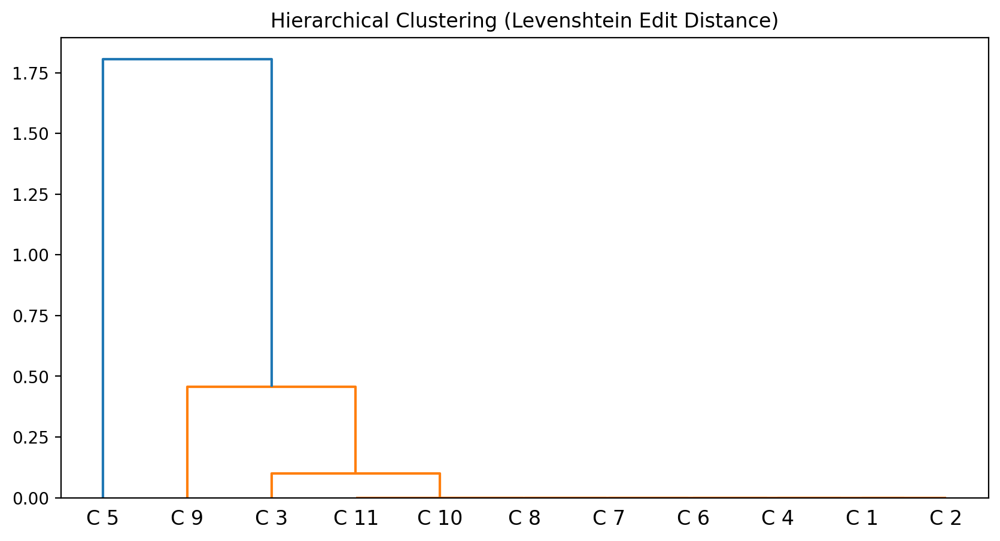

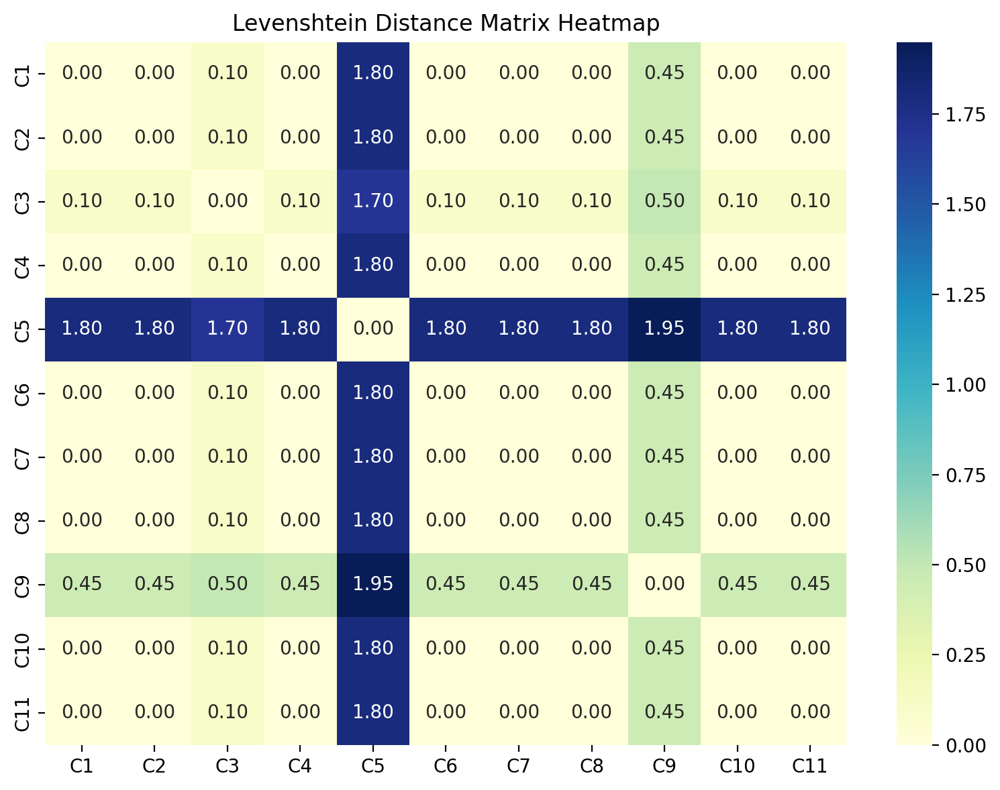

In [52]:
import numpy as np
import matplotlib.pyplot as plt
from typing import List, Tuple
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram
import seaborn as sns
from Levenshtein import distance as levenshtein_distance  # pip install python-Levenshtein

# === PITCH CONTOURS OF ONE SYLLABLE ===
# syllable = "C1L1B7"




# === RESAMPLE TO FIXED NUMBER OF BINS ===
def resample_to_bins(label_seq: List[str], n_bins: int) -> List[str]:
    total_len = len(label_seq)
    bin_size = total_len / n_bins
    resampled = []
    for i in range(n_bins):
        start = int(i * bin_size)
        end = int((i + 1) * bin_size)
        bin_labels = list(label_seq[start:end]) if end > start else [label_seq[start]]
        most_common = max(set(bin_labels), key=bin_labels.count)
        resampled.append(most_common)
    return resampled


# Choose coarse resolution
n_bins = alotted_beats[syllable]*10


resampled_segments = []

for segment in syllable_segments:
    resampled_segment = resample_to_bins(segment.astype("str"), n_bins)
    resampled_segments.append(resampled_segment)


# === EDIT DISTANCE MATRIX USING LEVENSHTEIN ===
N = len(resampled_segments)
ed_matrix = np.zeros((N, N))
for i in range(N):
    for j in range(i+1, N):
        dist = levenshtein_distance(''.join(resampled_segments[i]), ''.join(resampled_segments[j]))
        ed_matrix[i, j] = dist
        ed_matrix[j, i] = dist

ed_matrix/=n_bins

# === METRIC SUMMARY ===
print("\nPairwise Levenshtein Distances:")
for i in range(N):
    for j in range(i+1, N):
        print(f"Distance between Contour {i+1} and Contour {j+1}: {ed_matrix[i, j]:.3f}")

# === CLUSTERING ===
Z_ed = linkage(squareform(ed_matrix), method='average')

plt.figure(figsize=(10, 5))
dendrogram(Z_ed, labels=[f"C {i+1}" for i in range(N)])
plt.title("Hierarchical Clustering (Levenshtein Edit Distance)")
plt.show()

# # === HEATMAP OF DISTANCE MATRIX ===
plt.figure(figsize=(8, 6))
sns.heatmap(ed_matrix, annot=True, fmt=".2f", cmap="YlGnBu", xticklabels=[f"C{i+1}" for i in range(N)], yticklabels=[f"C{i+1}" for i in range(N)])
plt.title("Levenshtein Distance Matrix Heatmap")
plt.tight_layout()
plt.show()

# # === VISUALIZE RESAMPLED SYMBOLIC CONTOURS ===
# label_set = sorted(set(lbl for seq in resampled_segments for lbl in seq))
# label_map = {lbl: i for i, lbl in enumerate(label_set)}

# plt.figure(figsize=(12, 6))
# for idx, contour in enumerate(resampled_segments):
#     contour_numeric = [label_map[lbl] for lbl in contour]
#     plt.plot(np.linspace(0, 1, len(contour)), [i + idx * len(label_set) for i in contour_numeric], label=f"C {idx+1}")
# plt.title("Coarsened Symbolic Contours (Mapped to Integers)")
# plt.xlabel("Normalized Time")
# plt.ylabel("Quantized Label Index (Offset for Visibility)")
# plt.legend()
# plt.tight_layout()
# plt.show()


In [53]:
resampled_segments[0], resampled_segments[-1]

(['0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0'],
 ['0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0',
  '0.0'])

In [54]:
t1, t2 = ' '.join(resampled_segments[0]), ' '.join(resampled_segments[-1])

In [55]:
t1, t2

('0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0',
 '0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0')

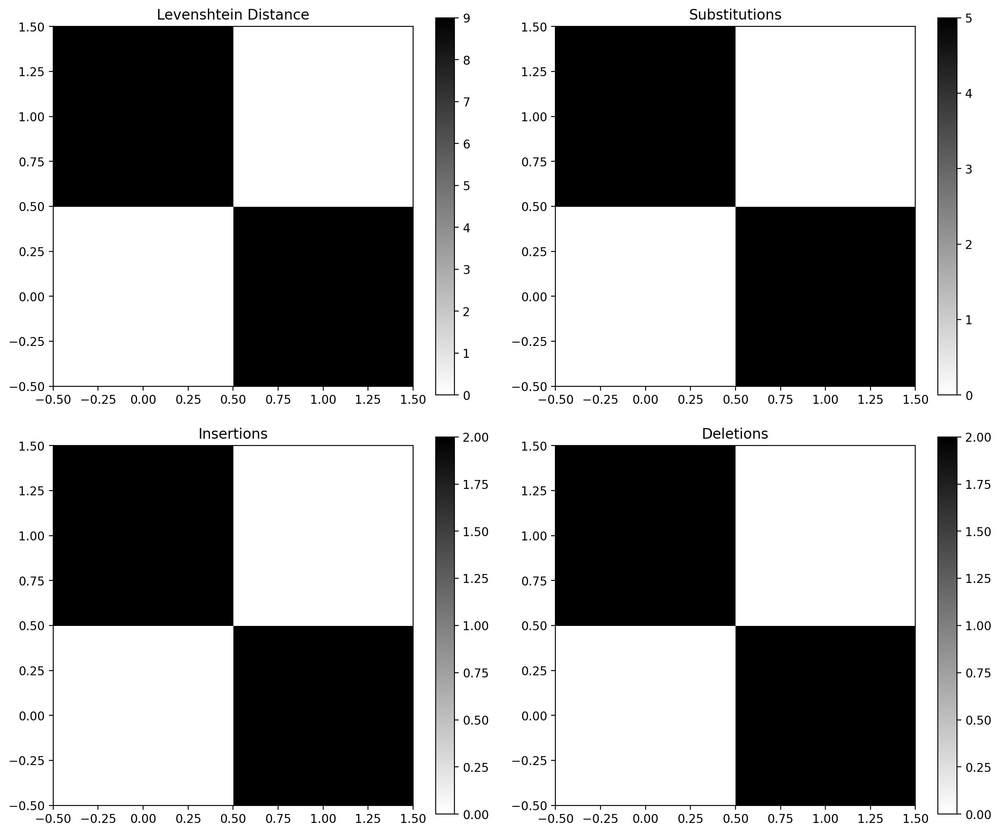

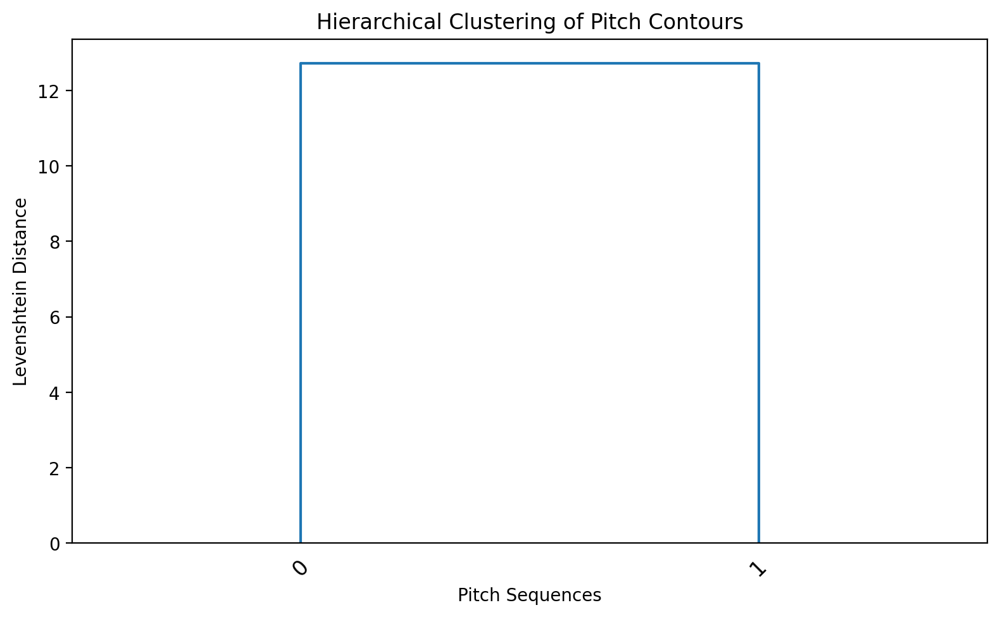

In [56]:
import numpy as np
import Levenshtein
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt


# syllable = "C1L2B9"
# syllable_segments = []

# for line in observations_per_id[syllable]:
#     s = int(line[0][0]*100)
#     e = int((line[0][0]+line[0][1])*100)
#     segment = [inst[1] for inst in raw_notes[s-100:e+100]]
#     syllable_segments.append(segment)



pitchSeq = [
    "SSSSRRGMMPPPPPPPPPPP",
    "MMMMMMMPPPPPPPPPPPPR"
]

# pitchSeq = ["".join(s) for s in syllable_segments]

n = len(pitchSeq)
distMat = np.zeros((n, n))
subsMat = np.zeros((n, n))
insMat = np.zeros((n, n))
delMat = np.zeros((n, n))

for i in range(n):
    for j in range(i + 1, n): 
        dist = Levenshtein.distance(pitchSeq[i], pitchSeq[j])
        editOperations = Levenshtein.editops(pitchSeq[i], pitchSeq[j])

        substitutions = sum(1 for op in editOperations if op[0] == "replace")
        insertions = sum(1 for op in editOperations if op[0] == "insert")
        deletions = sum(1 for op in editOperations if op[0] == "delete")

        distMat[i, j] = dist
        distMat[j, i] = dist 

        subsMat[i, j] = substitutions
        subsMat[j, i] = substitutions

        insMat[i, j] = insertions
        insMat[j, i] = insertions

        delMat[i, j] = deletions
        delMat[j, i] = deletions


fig, axes = plt.subplots(2, 2, figsize=(12, 10))

matrices = {
    "Levenshtein Distance": distMat,
    "Substitutions": subsMat,
    "Insertions": insMat,
    "Deletions": delMat,
}

for ax, (title, matrix) in zip(axes.flat, matrices.items()):
    im = ax.imshow(matrix, origin='lower', cmap='gray_r')
    # ax.set_xticks(np.arange(n))
    # ax.set_yticks(np.arange(n))
    # ax.set_xticklabels(pitchSeq, rotation=45, ha="right")
    # ax.set_yticklabels(pitchSeq)
    ax.set_title(title)
    plt.colorbar(im, ax=ax)

plt.tight_layout()


# Perform hierarchical clustering
linkageMatrix = sch.linkage(distMat, method="single")

# Plot the dendrogram
plt.figure(figsize=(8, 5))
sch.dendrogram(linkageMatrix, leaf_rotation=45)
plt.title("Hierarchical Clustering of Pitch Contours")
plt.xlabel("Pitch Sequences")
plt.ylabel("Levenshtein Distance")
plt.tight_layout()

plt.show()